# Complete analysis and treatment of Vertical MD4224 scan

In [1]:
import sys
import pickle
sys.path.append('/eos/user/s/sterbini/MD_ANALYSIS/public/')
sys.path.append('/eos/project/l/liu/Toolbox/')
from myToolbox import *
from scipy.signal import savgol_filter
import gzip
import pandas as pd

Version 0.03. This is the latest version.
Please help me to improve it reporting bugs to guido.sterbini@cern.ch.
Your platform is Linux-3.10.0-957.10.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
Your folder is /eos/home-h/harafiqu/SWAN_projects/PS/Simulations/V_Scan
Your IP is 172.17.0.13
2019-05-03 14:48:17


In [2]:
myFiles=glob.glob('/eos/user/h/harafiqu/MD4224/2018.09.05_vertical/2018*.mat')
len(myFiles)

450

# Make Tune and Intensity Dataframes

In [3]:
def fromMatlabToDataFrame(listing, listOfVariableToAdd, verbose=False, matlabFullInfo=False):
    listOfVariableToAdd=list(set(listOfVariableToAdd))
    myDataFrame=pnd.DataFrame({})
    cycleStamp=[]
    cycleStampHuman=[]
    PLS_matlab=[]
    matlabObject=[]
    matlabFilePath=[]
    for j in listOfVariableToAdd:
        exec(j.replace('.','_')+'=[]')
    for i in listing:
        if verbose:
            print(i)
        data=myToolbox.japcMatlabImport(i);
        if matlabFullInfo:
            matlabObject.append(data)
        #to correct
        localCycleStamp=np.nanmax(data.headerCycleStamps);
        deltaLocal_UTC=datetime.datetime.fromtimestamp(localCycleStamp/1e9)-datetime.datetime.utcfromtimestamp(localCycleStamp/1e9)
        utcCycleStamp=localCycleStamp+deltaLocal_UTC.total_seconds()*1e9
        cycleStamp.append(utcCycleStamp)
        aux=myToolbox.unixtime2datetimeVectorize(np.nanmax(data.headerCycleStamps)/1e9)
        cycleStampHuman.append(aux.tolist())
        PLS_matlab.append(data.cycleName)
        matlabFilePath.append(os.path.abspath(i))
        for j in listOfVariableToAdd:
            if hasattr(data,j.split('.')[0]):
                exec(j.replace('.','_') + '.append(data.' + j + ')')
            else:
                exec(j.replace('.','_') + '.append(np.nan)')
    myDataFrame['cycleStamp']=pnd.Series(cycleStamp,cycleStampHuman)
    myDataFrame['matlabPLS']=pnd.Series(PLS_matlab,cycleStampHuman)
    myDataFrame['matlabFilePath']=pnd.Series(matlabFilePath,cycleStampHuman)
    if matlabFullInfo:
        myDataFrame['matlabFullInfo']=pnd.Series(matlabObject,cycleStampHuman)
    for j in listOfVariableToAdd:
        exec('myDataFrame[\'' + j + '\']=pnd.Series(' +j.replace('.','_')+ ',cycleStampHuman)')    #myDataFrame=pnd.DataFrame({j:aux,
    return myDataFrame

In [4]:
# Convert mat files to dataframe
df_test = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp','PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp'])

In [5]:
# cleanup dataframe
df_test['PR_BCT_ST.Samples.cycleStamp']=df_test['PR_BCT_ST.Samples.cycleStamp']/1e9
df_test['PR_BQS72.SamplerAcquisition.cycleStamp']=df_test['PR_BQS72.SamplerAcquisition.cycleStamp']/1e9

In [6]:
df_test

,cycleStamp,matlabPLS,matlabFilePath,PR_BQS72.SamplerAcquisition.value.estimatedTuneV,PR_BQS72.SamplerAcquisition.cycleStamp,PR_BCT_ST.Samples.cycleStamp,PR_BCT_ST.Samples.value.samples,PR_BQS72.SamplerAcquisition.value.estimatedTuneH
2018-09-05 10:20:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.2391116740353679, 0.23971673231960905, 0.23...",1.536136e+09,1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.20977273575518698, 0.20940702780573384, 0.2..."
2018-09-05 10:21:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.23976878434647172, 0.24005858967109586, 0.2...",1.536136e+09,1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.20904288280545877, 0.2091414764329, 0.20907..."
2018-09-05 10:20:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.23979297109117814, 0.23927600776361443, 0.2...",1.536136e+09,1.536136e+09,"[-0.21493, -0.20040000000000002, -0.18587, -0....","[0.20910096986069623, 0.20919447601635738, 0.2..."
2018-09-05 10:21:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.22984427276260058, 0.23000876451501565, 0.2...",1.536136e+09,1.536136e+09,"[-0.19495, -0.18526, -0.17436000000000001, -0....","[0.20900025780414888, 0.20880781328871953, 0.2..."
2018-09-05 10:21:42.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.21960233799140136, 0.21974349999447174, 0.2...",1.536136e+09,1.536136e+09,"[-0.14228000000000002, -0.13138000000000002, -...","[0.20920446730191952, 0.20915974993014785, 0.2..."
2018-09-05 10:22:18.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.2102815567691356, 0.20942227306900782, 0.20...",1.536136e+09,1.536136e+09,"[-0.13864, -0.12593000000000001, -0.1150300000...","[0.20715974144784158, 0.20999031660603723, 0.2..."
2018-09-05 10:22:54.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.19871366825637893, 0.1989663926550141, 0.20...",1.536136e+09,1.536136e+09,"[-0.19676000000000002, -0.18345, -0.17013, -0....","[0.2100921495539858, 0.20985952297053748, 0.20..."
2018-09-05 10:23:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.1899620637501338, 0.1906069731650187, 0.189...",1.536136e+09,1.536136e+09,"[-0.21372000000000002, -0.20040000000000002, -...","[0.20933471986513602, 0.20873250795510992, 0.2..."
2018-09-05 10:24:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.18002022523528952, 0.1798854030479251, 0.18...",1.536136e+09,1.536136e+09,"[-0.16226000000000002, -0.15499000000000002, -...","[0.20916809409599718, 0.2091351622165313, 0.20..."
2018-09-05 10:24:42.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.171126744770092, 0.17001407402332383, 0.171...",1.536136e+09,1.536136e+09,"[-0.12714, -0.11564, -0.10716, -0.089000000000...","[0.20855192735048142, 0.20957426025888468, 0.2..."


In [7]:
# Check cyclestamp differences

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['PR_BCT_ST.Samples.cycleStamp'] - row['PR_BQS72.SamplerAcquisition.cycleStamp'])/row['PR_BCT_ST.Samples.cycleStamp']
    differences.append(difference)
    
print 'Difference between BCT and BQS73 cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['cycleStamp'] - (row['PR_BCT_ST.Samples.cycleStamp']*1E9))/row['cycleStamp']
    differences.append(difference)
    
print '\nDifference between BCT and cyclestamp cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

Difference between BCT and BQS73 cycle times (percentage) 
 Mean: 2.23347503095737e-11  Min: 0.0  Max: 1.0050637639308164e-08

Difference between BCT and cyclestamp cycle times (percentage) 
 Mean: 4.68740573399049e-06  Min: 4.687012369152908e-06  Max: 4.735469788809376e-06


In [8]:
df_bct = fromMatlabToDataFrame(myFiles,['PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp', 'PR_SCBFC.Samples.value.samples'])
df_bqs72 = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp'])

In [9]:
df_first = pnd.merge(df_bct, df_bqs72, left_on = 'PR_BCT_ST.Samples.cycleStamp',  right_on = 'PR_BQS72.SamplerAcquisition.cycleStamp')

In [10]:
# Have to convert this for unknown reason (myToolbox.unixtime2datetimeVectorize expects this converted cycleStamp)
df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']/1e9
# copy to new column
df_first['cf_cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']
# rename BCT cyclestamp to cycleStamp
df_first = df_first.rename(index=str, columns={"PR_BCT_ST.Samples.cycleStamp" : "cycleStamp", })
# convert to datetime
#df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
df_first['cf_timeStamp'] = df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
#df_first['cf_timeStamp']=df_first['timeStamp']
# Set index
df_first = df_first.set_index(['cycleStamp'])
df_first = df_first.drop(labels='matlabFilePath_x',axis='columns')
df_first = df_first.drop(labels='matlabFilePath_y',axis='columns')
df_first = df_first.drop(labels='cycleStamp_x',axis='columns')
df_first = df_first.drop(labels='cycleStamp_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_x',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.cycleStamp',axis='columns')
#df_first = df_first.drop(labels='PR_BCT_ST.Samples.cycleStamp',axis='columns')

In [11]:
df_first['Qx']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneH'][20:280]),axis=1)
df_first['Qy']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneV'][20:280]),axis=1)

In [12]:
# Remove anomalous cases etc
#df_first = df_first.drop(df_first[df_first['Qx'] < .295].index )
df_first = df_first.dropna(axis=0,how='all',subset =['Qy'])
df_first = df_first.dropna(axis=0,how='all',subset =['Qx'])
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneV',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneH',axis='columns')
#df_mergetest

In [13]:
df_first

,PR_BCT_ST.Samples.value.samples,PR_SCBFC.Samples.value.samples,cf_cycleStamp,cf_timeStamp,Qx,Qy
cycleStamp,,,,,,
1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:19:54.700,0.208865,0.239484
1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:19:54.700,0.208865,0.239484
1.536136e+09,"[-0.21493, -0.20040000000000002, -0.18587, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:20:30.700,0.208899,0.239078
1.536136e+09,"[-0.19495, -0.18526, -0.17436000000000001, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:21:06.700,0.208694,0.229331
1.536136e+09,"[-0.14228000000000002, -0.13138000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:21:42.700,0.208412,0.219715
1.536136e+09,"[-0.13864, -0.12593000000000001, -0.1150300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:22:18.700,0.208581,0.209510
1.536136e+09,"[-0.19676000000000002, -0.18345, -0.17013, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:22:54.700,0.208356,0.199719
1.536136e+09,"[-0.21372000000000002, -0.20040000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:23:30.700,0.208183,0.189839
1.536136e+09,"[-0.16226000000000002, -0.15499000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:24:06.700,0.208225,0.179881


In [14]:
# Check chirp time
test = myToolbox.japcMatlabImport(myFiles[0])
test.PR_BQS72.SamplerAcquisition.value.acqOffset

20

# Intensity, Losses, Ratio

In [15]:
def intensity_df(ndf,start=85,end=1185):
    df=ndf.copy()
    def losses(a):
        try:
            b=(a[start]-a[end])/a[start]*100 
        except:
            b=np.nan
        return b
    def ratio(a):
        try:
            c=a[end]/a[start]
        except:
            c=np.nan
        return c
    def max_intensity(a):
        try:
            d=np.max(a)
        except:
            d=np.nan
        return d*1E10
    df['intensity']=df['PR_BCT_ST.Samples.value.samples'].apply(max_intensity)
    df['losses']=df['PR_BCT_ST.Samples.value.samples'].apply(losses)
    df['ratio']=df['PR_BCT_ST.Samples.value.samples'].apply(ratio)
    return df

In [16]:
df_second=intensity_df(df_first,start=70,end=1185)

In [17]:
df_second = df_second.drop(labels='PR_BCT_ST.Samples.value.samples',axis='columns');
df_second = df_second.set_index(['cf_timeStamp']);
df_second

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,
2018-09-05 10:19:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208865,0.239484,7.023244e+11,2.106413,0.978936
2018-09-05 10:19:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208865,0.239484,7.023244e+11,2.106413,0.978936
2018-09-05 10:20:30.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208899,0.239078,7.548161e+11,1.698342,0.983017
2018-09-05 10:21:06.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208694,0.229331,7.327544e+11,2.203742,0.977963
2018-09-05 10:21:42.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208412,0.219715,6.951734e+11,2.985061,0.970149
2018-09-05 10:22:18.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208581,0.209510,7.361018e+11,3.982576,0.960174
2018-09-05 10:22:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208356,0.199719,7.079539e+11,2.690493,0.973095
2018-09-05 10:23:30.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208183,0.189839,7.265163e+11,1.429472,0.985705
2018-09-05 10:24:06.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208225,0.179881,7.214954e+11,0.909661,0.990903


In [18]:
df_second = df_second.drop(df_second.index[0])
df_second[df_second.index.duplicated()]

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,


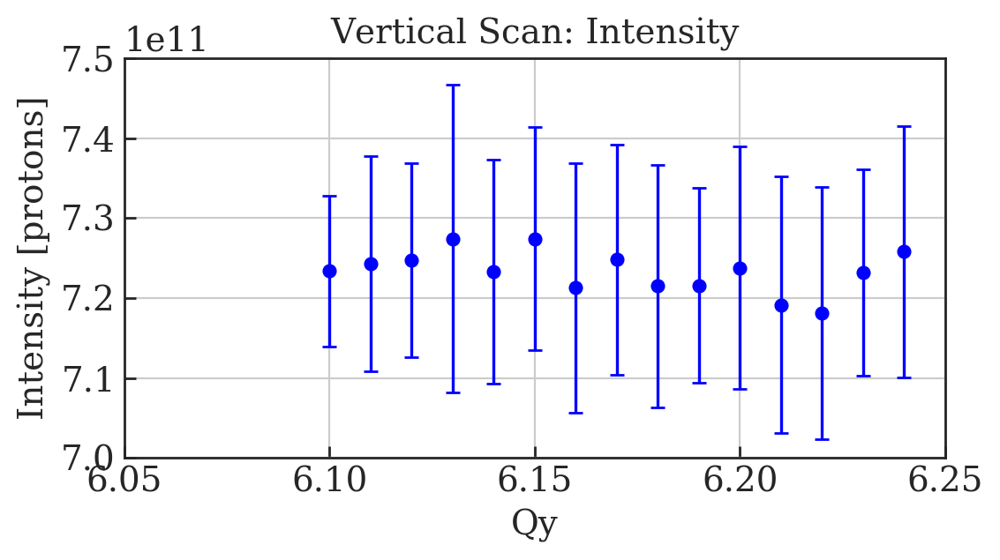

In [19]:
# Plot averaged data points with error bars
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df_second['intensity'][(df_second['Qy']>lower_lim)][(df_second['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df_second['intensity'][(df_second['Qy']>lower_lim)][(df_second['Qy']<upper_lim)] ) )
    
    
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');

plt.errorbar(x_data, y_data_172, y_error_172, linestyle='None', marker='o', capsize=3, color='b')

x_d = np.linspace(6.0, 7.0, 2)
y_d = (7.25E11, 7.25E11)
#plt.plot(x_d, y_d, 'r-', label='7.25E11')

plt.xlabel('Qy');
plt.ylabel('Intensity [protons]');
plt.title('Vertical Scan: Intensity')
plt.ylim(70E10,75E10)
plt.xlim(6.05, 6.25)
#plt.legend()
plt.grid();
fig.savefig('MD4224_Complete_Vertical_Intensities_Errors.png');

# Timber: Vertical

In [20]:
def read_data(year=2018,month=9,date=5,hour=10,minutes=0,span=5,user='CPS%MD1',WS='64.V'):
    t1=datetime.datetime(year,month,date,hour,minutes)
    t2=t1+datetime.timedelta(hours=span)
    CALS=['PR.BWS.{}_ROT:PROF_DATA_IN'.format(WS),  'PR.BWS.{}_ROT:PROF_POSITION_IN'.format(WS),  'PR.BWS.{}_ROT:ACQ_DELAY'.format(WS), 'PR.BCT.LT:SAMPLES']
    df=myToolbox.fromTimberToDataFrame(CALS,t1,t2,fundamental=user)
    return  df

In [21]:
dfV=read_data(year=2018,date=5,month=9,hour=10,minutes=0,span=5,user='CPS%MD1',WS='64.V');

In [22]:
len(dfV)

432

In [23]:
dfV

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BCT.LT:SAMPLES,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.14046, -0.13017, -0.11988, -0.1005, -0.082...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+18
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.20706, -0.18889, -0.17557, -0.15317, -0.12...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+18
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.21311, -0.20282, -0.18889, -0.1671, -0.150...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+18
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.13985, -0.12956, -0.13198, -0.11685, -0.10...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+18
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.14591, -0.12472, -0.11624, -0.10111, -0.08...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+18
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.20464, -0.18526, -0.16831, -0.14349, -0.12...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+18
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.22098, -0.21008, -0.20161, -0.18223, -0.15...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+18
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.1562, -0.15136, -0.14409, -0.13441, -0.120...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+18
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.11806, -0.1114, -0.10413, -0.09142, -0.076...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+18
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.18284, -0.16347, -0.15075, -0.1338, -0.113...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+18


# Manual Fit

In [24]:
def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def gaussian_4_parameters(x, m, A, mu, sig):
    """gaussian_4_parameter(x, m, A, mu, sig)"""
    return m*x+A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def gaussian_5_parameters(x, c, m, A, mu, sig):
    """gaussian_5_parameter(x, c, m, A, mu, sig)"""
    return c+m*x+A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def second_moment(values, weights):
    weighted_average = np.average(values, weights=weights)
    second_moment = np.sqrt(np.average((values-weighted_average)**2, weights=weights))
    return (second_moment)

def second_moment_2(values, weights, sig, n_sigmas=6.):
    a=np.where((values<n_sigmas*sig) & (values>-n_sigmas*sig))[0]
    values=values[a]
    weights=weights[a]    
    weighted_average = np.average(values, weights=weights)
    second_moment = np.sqrt(np.average((values-weighted_average)**2, weights=weights))
    return (second_moment)

def filtered(a):
    try:
        b=(scipy.signal.savgol_filter(a,15,1))
    except:
        b=a
    return b

def Multi_filter(ndf, with_plot = False, WS = '65.H', sig_limit_mm=10, smooth = False):
    
    df = ndf.copy()
    
    position_label = 'PR.BWS.'+WS+'_ROT:PROF_POSITION_IN'
    profile_label = 'PR.BWS.'+WS+'_ROT:PROF_DATA_IN'
    
    window = 40    
    
    # Arrays to hold dataframe data. Appended to dataframe at the end of the loop.
    mu_5 = []
    sigma_5 = []
    A_5 = []
    m_5 = []
    c_5 = []
    sig_err_5 = []
    
    mu_3 = []
    sigma_3 = []
    A_3 = []
    sig_err_3 = []
    
    mom_2nd = []
    
    filtered_profiles = []
    filtered_positions = []
    
    failed_rows = []
    
    new_new_X=[]
    
    # Iterate over dataframe
    for j in range(0, len(df), 1):
        print '\nMulti_filter row ', j
        
# 5 parameter Gaussian fit to find mean and sigma
#------------------------------------------------
    
        data = []
        # Filter the data (scipy.signal.savgol_filter)
        if smooth: data = filtered(df[profile_label].iloc()[j])    
        else:data = df[profile_label].iloc()[j]
            
        X = df[position_label].iloc()[j]/1000.
        Y = data
        indx_max = np.argmax(Y)
        mu0 = X[indx_max]
        x_tmp = X
        y_tmp = Y
        offs0 = min(y_tmp)
        ampl = max(y_tmp)-offs0
        x1 = x_tmp[np.searchsorted(y_tmp[:window], offs0+ampl/2)]
        x2 = x_tmp[np.searchsorted(-y_tmp[window:], -offs0+ampl/2)]
        FWHM = x2-x1
        #sigma0 = np.abs(2*FWHM/2.355)
        sigma0 = 5
        ampl *= np.sqrt(2*np.pi)*sigma0
        slope = 0
        
        popt5 = []
        pcov5 = []    

        popt5, pcov5 = curve_fit(gaussian_5_parameters, X, data, p0 =[offs0, slope, ampl, mu0, sigma0])
        result5 = gaussian_5_parameters(X, popt5[0], popt5[1], popt5[2], popt5[3], popt5[4])

        fit_c_5 = popt5[0]
        fit_m_5 = popt5[1]
        fit_A_5 = popt5[2]
        fit_mean_5 = popt5[3]
        fit_sigma_5 = abs(popt5[4])
        
        c_5.append(np.array(popt5[0]))
        m_5.append(np.array(popt5[1]))
        A_5.append(np.array(popt5[2]))
        mu_5.append(np.array(popt5[3]))
        sigma_5.append(abs(np.array(abs(popt5[4]))))
        sig_err_5.append(np.sqrt(np.diag(pcov5[4])[4][4]))
        
        print '5 parameter fit sigma = ', fit_sigma_5 , ' +/- ', np.sqrt(np.diag(pcov5[4]))[4][4]
    
        if fit_sigma_5 > sig_limit_mm:
            
            print '\n\tinitial guess: mu0', mu0
            print '\tinitial guess: offs0', offs0
            print '\tinitial guess: ampl', ampl
            print '\tinitial guess: slope', slope
            print '\tinitial guess: sigma0', sigma0
            
            result0 = gaussian_5_parameters(X, offs0, slope, ampl, mu0, sigma0)
            
            fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

            plt.plot(X, df[profile_label].iloc()[j], label='raw');
            plt.plot(X, result5, label='5 param fit');
            plt.plot(X, result0, label='initial param fit');

            tit = 'WS profile & fit ' + str(j);
            savename = 'MD4224_HB_Vertical_Multifit_' + str(j);

            plt.title(tit);
            plt.ylabel('Profile [-]');
            plt.xlabel('Position [mm]');
            plt.legend();            
            plt.grid();
            fig.savefig(savename);    
            plt.close();
            
            # Set empty array values for completeness - cannot set dataframe with missing values
            filtered_profiles.append(np.nan)
            filtered_positions.append(np.nan)
            
            failed_rows.append(j)

            mom_2nd.append(np.nan)

            c_5.append(np.nan)
            m_5.append(np.nan)
            A_5.append(np.nan)
            mu_5.append(np.nan)
            sigma_5.append(np.nan)
            sig_err_5.append(np.nan)

            A_3.append(np.nan)
            mu_3.append(np.nan)
            sigma_3.append(np.nan)
            sig_err_3.append(np.nan)        
  
            
        # Simple filter for negative sigma (fit didn't work)
        elif fit_sigma_5 < sig_limit_mm:
            
# Consider only data between +/-(6 sigma + mean)
#------------------------------------------------
            new_X = []
            new_Y = []        

            # Iterate over data
            for i in xrange(len(Y)): # Append data if inside cut window
                if (X[i] < (6*fit_sigma_5 + fit_mean_5)) and (X[i] > (-6*fit_sigma_5 + fit_mean_5)):

# Remove Slope and Offset
#------------------------------------------------               
                    new_X.append(X[i])
                    new_Y.append(Y[i] - (fit_m_5*X[i] + fit_c_5))

# 3 parameter Gaussian fit to centre
#------------------------------------------------

            popt3 = []
            pcov3 = []   
            popt3, pcov3 = curve_fit(gaussian_3_parameters, new_X, new_Y, p0 =[fit_A_5, fit_mean_5, fit_sigma_5])
            result3 = gaussian_3_parameters(new_X, popt3[0], popt3[1], popt3[2])

            fit_A_3 = popt3[0]
            fit_mean_3 = popt3[1]
            fit_sigma_3 = popt3[2]

            A_3.append(np.array(popt3[0]))
            mu_3.append(np.array(popt3[1]))
            sigma_3.append(np.array(abs(popt3[2])))
            sig_err_3.append(np.sqrt(np.diag(pcov3[2]))[2][2])     

            print '3 parameter fit sigma = ', popt3[2] , ' +/- ', np.sqrt(np.diag(pcov3[2]))[2][2]

# Threshold ?
#------------------------------------------------

# 2nd moment
#------------------------------------------------
            # Shift centre
            new_new_X = new_X - fit_mean_3

            second_mom = second_moment(new_new_X, new_Y)

            mom_2nd.append(second_mom)

            print 'Second moment = ', second_mom        

            # Append to dataframe later
            filtered_positions.append(new_new_X)
            filtered_profiles.append(new_Y)       

# Plot
#------------------------------------------------      
            if with_plot:
                fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

                plt.plot(X, df[profile_label].iloc()[j], label='raw');
                plt.plot(X, result5, label='5 param fit');
                plt.plot(new_new_X, result3, label='3 param fit' );
                plt.plot(new_new_X, new_Y, label='filtered');

                tit = 'WS profile & fit ' + str(j);
                savename = 'MD4224_HB_Vertical_Multifit_' + str(j);

                plt.title(tit);
                plt.ylabel('Profile [-]');
                plt.xlabel('Position [mm]');
                plt.legend();            
                plt.grid();
                fig.savefig(savename);
                plt.close();

    # Set values in dataframe   
    
#     df['5sig '+WS[-1]] = sigma_5
#     df['5sig err'+WS[-1]] = sig_err_5
#     df['5A '+WS[-1]] = A_5
#     df['5mu '+WS[-1]] = mu_5
#     df['5m '+WS[-1]] = m_5
#     df['5c '+WS[-1]] = c_5
    
#     df['3sig '+WS[-1]] = sigma_3
#     df['3sig err'+WS[-1]] = sig_err_3
#     df['3A '+WS[-1]] = A_3
#     df['3mu '+WS[-1]] = mu_3
    
    df['2ndMoment '+WS[-1]] = mom_2nd   
    
    df['sig '+WS[-1]] = sigma_3
    df['sig err'+WS[-1]] = sig_err_3
    df['A '+WS[-1]] = A_3
    df['mu '+WS[-1]] = mu_3
    
    df['position '+WS[-1]] = filtered_positions
    df['profile '+WS[-1]] = filtered_profiles
    
    print 'failed rows = ', failed_rows
    
    return df

In [25]:
df_V_filtered = Multi_filter(dfV, with_plot = True, WS = '64.V' )


Multi_filter row  0
5 parameter fit sigma =  2.788639104835815  +/-  0.003926192248341214
3 parameter fit sigma =  2.7886402929181093  +/-  0.02020046673627379
Second moment =  3.132208047565709


/usr/local/bin/start_ipykernel.py:111: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:193: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:195: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  1
5 parameter fit sigma =  2.858593627149108  +/-  0.002885842102213625
3 parameter fit sigma =  2.8585942702020866  +/-  0.014355616628631657
Second moment =  3.010831988291384

Multi_filter row  2
5 parameter fit sigma =  2.9297937624023582  +/-  0.0027836260209190165
3 parameter fit sigma =  2.9297941431604184  +/-  0.01368008551850069
Second moment =  2.95593746144889

Multi_filter row  3
5 parameter fit sigma =  3.03067158571614  +/-  0.00397149996655544
3 parameter fit sigma =  3.030670821156049  +/-  0.019400945200456904
Second moment =  3.0818150684456613

Multi_filter row  4
5 parameter fit sigma =  2.903034667149036  +/-  0.003289527175167738
3 parameter fit sigma =  2.903034628859224  +/-  0.01599599322154827
Second moment =  3.04020618330891

Multi_filter row  5
5 parameter fit sigma =  2.9386150270343565  +/-  0.0027079650262858243
3 parameter fit sigma =  2.9386151716389737  +/-  0.012731998318958746
Second moment =  3.1521356533431057

Multi_filter row


Multi_filter row  43
5 parameter fit sigma =  3.2077592037613436  +/-  0.003038611683899817
3 parameter fit sigma =  3.20775939076019  +/-  0.013391813207045147
Second moment =  3.148729308076565

Multi_filter row  44
5 parameter fit sigma =  3.212679209880033  +/-  0.0033991757549855506
3 parameter fit sigma =  3.2126797158444123  +/-  0.015339395637993625
Second moment =  3.2874503169522438

Multi_filter row  45
5 parameter fit sigma =  3.248660711130314  +/-  0.0029255590444793194
3 parameter fit sigma =  3.2486607768424545  +/-  0.012595510400107618
Second moment =  3.185877221209128

Multi_filter row  46
5 parameter fit sigma =  3.2729013041343573  +/-  0.003464355989366678
3 parameter fit sigma =  3.2729022183233094  +/-  0.015173678859251387
Second moment =  3.1271615631451355

Multi_filter row  47
5 parameter fit sigma =  3.86700173492837  +/-  0.005363851386047704
3 parameter fit sigma =  3.867000048252819  +/-  0.022424172521737964
Second moment =  3.718372765281439

Multi_f


Multi_filter row  85
5 parameter fit sigma =  3.115369577535007  +/-  0.0033006471241627563
3 parameter fit sigma =  3.11536959685749  +/-  0.015118915470420179
Second moment =  3.1856558399115076

Multi_filter row  86
5 parameter fit sigma =  3.0978008580707397  +/-  0.0035802032591501806
3 parameter fit sigma =  3.09780270921239  +/-  0.016567853231972268
Second moment =  3.3236569031533656

Multi_filter row  87
5 parameter fit sigma =  3.117402951439272  +/-  0.003003655739935901
3 parameter fit sigma =  3.1174029822157996  +/-  0.013476623007244354
Second moment =  3.1710015722452556

Multi_filter row  88
5 parameter fit sigma =  3.2638256000724186  +/-  0.0029465615593740257
3 parameter fit sigma =  3.263825658267733  +/-  0.012858573797899779
Second moment =  3.3488036708816837

Multi_filter row  89
5 parameter fit sigma =  3.341852771718139  +/-  0.0032414170492218353
3 parameter fit sigma =  3.341851504801611  +/-  0.014119228641374817
Second moment =  3.411721845542196

Multi


Multi_filter row  127
5 parameter fit sigma =  2.9706989956030636  +/-  0.002823834664880414
3 parameter fit sigma =  2.970699133465817  +/-  0.013071123973220878
Second moment =  3.046979449657365

Multi_filter row  128
5 parameter fit sigma =  3.0053616430151053  +/-  0.0028727949058561545
3 parameter fit sigma =  3.0053617563229675  +/-  0.01328509924682709
Second moment =  3.2452464536876677

Multi_filter row  129
5 parameter fit sigma =  3.0065481153540556  +/-  0.0027852194659353483
3 parameter fit sigma =  3.0065492751066367  +/-  0.012527461907247206
Second moment =  3.1962270233754513

Multi_filter row  130
5 parameter fit sigma =  3.08989028999737  +/-  0.0030530976339270244
3 parameter fit sigma =  3.089890628002465  +/-  0.01361030850638045
Second moment =  3.1779954321284185

Multi_filter row  131
5 parameter fit sigma =  3.2026232703837083  +/-  0.0034245500880798457
3 parameter fit sigma =  3.202623800452987  +/-  0.015481540733375647
Second moment =  3.1624297751224524


Multi_filter row  169
5 parameter fit sigma =  5.067596217303044  +/-  0.00870087121270184
3 parameter fit sigma =  5.067607782072066  +/-  0.03144212103514252
Second moment =  4.64196422107923

Multi_filter row  170
5 parameter fit sigma =  5.437309600625267  +/-  0.007252910162082991
3 parameter fit sigma =  5.437307890202833  +/-  0.024461944043441528
Second moment =  4.82742084304076

Multi_filter row  171
5 parameter fit sigma =  6.088183682260249  +/-  0.008041782083376291
3 parameter fit sigma =  6.088190834916369  +/-  0.024127843416587687
Second moment =  5.750909474640219

Multi_filter row  172
5 parameter fit sigma =  3.088317702015271  +/-  0.0028561034200814566
3 parameter fit sigma =  3.088317910145856  +/-  0.012672654800295618
Second moment =  3.230935043383413

Multi_filter row  173
5 parameter fit sigma =  2.9973091871207647  +/-  0.003498092750834831
3 parameter fit sigma =  2.9973098136948564  +/-  0.016622247173113665
Second moment =  3.0193677385920323

Multi_fil


Multi_filter row  211
5 parameter fit sigma =  5.0322827195195785  +/-  0.0069856341635477675
3 parameter fit sigma =  5.03228505175098  +/-  0.024908395915871538
Second moment =  4.725671460222092

Multi_filter row  212
5 parameter fit sigma =  5.384044428186338  +/-  0.007348735187256475
3 parameter fit sigma =  5.384037257739179  +/-  0.02514503499989207
Second moment =  4.914137131160048

Multi_filter row  213
5 parameter fit sigma =  6.234048235933724  +/-  0.010278646036700848
3 parameter fit sigma =  6.234055401697568  +/-  0.027458246287221162
Second moment =  6.347280142534706

Multi_filter row  214
5 parameter fit sigma =  3.0906291996050608  +/-  0.003264469166926678
3 parameter fit sigma =  3.09062961330752  +/-  0.014906850701831377
Second moment =  3.285275007616528

Multi_filter row  215
5 parameter fit sigma =  3.0347719911672466  +/-  0.0034823089757052934
3 parameter fit sigma =  3.0347749814069185  +/-  0.016364213939603193
Second moment =  3.0400087736338324

Multi


Multi_filter row  253
5 parameter fit sigma =  4.833960286044729  +/-  0.007658522831201778
3 parameter fit sigma =  4.833955729387509  +/-  0.02840954708854571
Second moment =  4.681133512509626

Multi_filter row  254
5 parameter fit sigma =  4.928631281744715  +/-  0.007279241523908445
3 parameter fit sigma =  4.9286339675352435  +/-  0.026513524883887477
Second moment =  4.460466177553136

Multi_filter row  255
5 parameter fit sigma =  5.179826820199434  +/-  0.0061835790465860924
3 parameter fit sigma =  5.17982519173261  +/-  0.021023451537859488
Second moment =  5.382563177798832

Multi_filter row  256
5 parameter fit sigma =  5.670694797517766  +/-  0.008046930369489246
3 parameter fit sigma =  5.670689828361608  +/-  0.024482428129337746
Second moment =  6.11631296586035

Multi_filter row  257
5 parameter fit sigma =  3.058178346518233  +/-  0.002849250340798743
3 parameter fit sigma =  3.0581784575503352  +/-  0.012796874313891936
Second moment =  3.2282673563699174

Multi_fi


Multi_filter row  295
5 parameter fit sigma =  4.3002448418620265  +/-  0.004902457234734056
3 parameter fit sigma =  4.300248120342986  +/-  0.018911681739666952
Second moment =  4.072942393615452

Multi_filter row  296
5 parameter fit sigma =  4.873646711901514  +/-  0.006630921203451359
3 parameter fit sigma =  4.8736444433963335  +/-  0.024359428266150947
Second moment =  4.231152165301543

Multi_filter row  297
5 parameter fit sigma =  5.083687705095635  +/-  0.007273581998392487
3 parameter fit sigma =  5.083696557450538  +/-  0.025718670823355758
Second moment =  5.049863518872684

Multi_filter row  298
5 parameter fit sigma =  5.231633983186087  +/-  0.006797930431002722
3 parameter fit sigma =  5.2316298796078105  +/-  0.02327799392650045
Second moment =  4.859402144157615

Multi_filter row  299
5 parameter fit sigma =  5.936662717969319  +/-  0.007221927548286136
3 parameter fit sigma =  5.936664727844024  +/-  0.021662581856324678
Second moment =  5.285005620226225

Multi_f


Multi_filter row  337
5 parameter fit sigma =  4.118842871846818  +/-  0.004470765555320324
3 parameter fit sigma =  4.118840509438285  +/-  0.017195740703115817
Second moment =  3.798278257640132

Multi_filter row  338
5 parameter fit sigma =  4.379435846310719  +/-  0.0050990216705279695
3 parameter fit sigma =  4.379438234770674  +/-  0.019110166355186423
Second moment =  3.937155655491467

Multi_filter row  339
5 parameter fit sigma =  4.757155134489794  +/-  0.0061159428204320375
3 parameter fit sigma =  4.757162999925342  +/-  0.022488830515285736
Second moment =  4.260101117530082

Multi_filter row  340
5 parameter fit sigma =  4.834664458241774  +/-  0.005782962534542856
3 parameter fit sigma =  4.834666747849226  +/-  0.02059045037325988
Second moment =  4.343414767541031

Multi_filter row  341
5 parameter fit sigma =  5.173477508688144  +/-  0.0062096317165531685
3 parameter fit sigma =  5.173477812232418  +/-  0.020993569530496553
Second moment =  5.178440225854646

Multi_f


Multi_filter row  379
5 parameter fit sigma =  3.970963448511826  +/-  0.005114207244165978
3 parameter fit sigma =  3.9709652488799954  +/-  0.02062069157603321
Second moment =  3.903058431586273

Multi_filter row  380
5 parameter fit sigma =  4.475631651214205  +/-  0.0056946200398541365
3 parameter fit sigma =  4.475633726400489  +/-  0.021549510307754666
Second moment =  4.23112034221683

Multi_filter row  381
5 parameter fit sigma =  4.789079016376655  +/-  0.005921448196787091
3 parameter fit sigma =  4.789080416663654  +/-  0.021160266381018807
Second moment =  4.753979128789034

Multi_filter row  382
5 parameter fit sigma =  4.851921958214868  +/-  0.005499624706111876
3 parameter fit sigma =  4.851926403296138  +/-  0.019151173041030332
Second moment =  4.316443605561174

Multi_filter row  383
5 parameter fit sigma =  5.375408272788496  +/-  0.006119625705718025
3 parameter fit sigma =  5.375407095483687  +/-  0.020183106449062696
Second moment =  5.268982885799633

Multi_fil


Multi_filter row  421
5 parameter fit sigma =  5.0027704076878665  +/-  0.0063041556635334535
3 parameter fit sigma =  5.002776096682377  +/-  0.022138328018499038
Second moment =  4.681174577610851

Multi_filter row  422
5 parameter fit sigma =  5.280539582283908  +/-  0.006895837882123477
3 parameter fit sigma =  5.2805376503690775  +/-  0.02368507945686194
Second moment =  5.458707349318727

Multi_filter row  423
5 parameter fit sigma =  5.758378694919666  +/-  0.007786504213024496
3 parameter fit sigma =  5.758377063796965  +/-  0.023799634038589496
Second moment =  6.045096201089692

Multi_filter row  424
5 parameter fit sigma =  2.9953858936667754  +/-  0.0028417610780446887
3 parameter fit sigma =  2.995385945355646  +/-  0.012965846363954505
Second moment =  3.137697153089356

Multi_filter row  425
5 parameter fit sigma =  2.8542395557595266  +/-  0.00267057049435412
3 parameter fit sigma =  2.8542408106521315  +/-  0.012376487817248372
Second moment =  3.1451846544804543

Mul

In [26]:
df_V_filtered = df_V_filtered.dropna(axis=0, how='all', subset=['profile V']);
df_V_filtered = df_V_filtered.dropna(axis=0, how='all', subset=['sig V']);
df_V_filtered = df_V_filtered.drop(labels = 'PR.BCT.LT:SAMPLES',axis='columns');
df_V_filtered['cycleStamp'] = df_V_filtered['cycleStamp']/1e9;
df_V_filtered['timeStamp_h'] = df_V_filtered['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize);


In [27]:
df_V_filtered

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,timeStamp_h
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+09,3.132208,2.7886402929181093,0.020200,6.452195201225923,1.4161365066912859,"[16.608863493308714, 16.534863493308716, 16.41...","[0.000776702050126421, 0.000574348051127882, 0...",2018-09-05 12:12:06.700
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+09,3.010832,2.8585942702020866,0.014356,6.740661295927736,1.221591016314844,"[17.144408983685157, 17.09040898368516, 17.037...","[-0.00024597228561037965, -0.00024592133172846...",2018-09-05 12:12:42.700
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+09,2.955937,2.9297941431604184,0.013680,6.83515413997671,1.1734280946355182,"[17.495571905364482, 17.35757190536448, 17.302...","[-0.0003046735899116526, 0.0009069395982613804...",2018-09-05 12:13:18.700
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+09,3.081815,3.030670821156049,0.019401,6.964632068580115,1.1043962999179182,"[18.08360370008208, 17.94960370008208, 17.8686...","[0.0018511974682094978, 0.0012413400654321116,...",2018-09-05 12:13:54.700
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+09,3.040206,2.903034628859224,0.015996,5.022052891748524,1.1126631931312738,"[17.390336806868728, 17.308336806868727, 17.30...","[0.0010362362048673412, 0.0012393421806040361,...",2018-09-05 12:14:30.700
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+09,3.152136,2.9386151716389737,0.012732,4.991960311561539,1.122423422705334,"[17.574576577294664, 17.463576577294663, 17.35...","[0.002213751375130024, 0.002827721597545463, 0...",2018-09-05 12:15:06.700
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+09,3.098637,2.9823574055277153,0.023715,4.957005998822932,0.8996482102654576,"[17.853351789734543, 17.769351789734543, 17.65...","[0.001875227445048061, 0.0018753333458864097, ...",2018-09-05 12:15:42.700
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+09,3.090829,2.9284429512550947,0.015198,5.178244007097413,1.158736229389001,"[17.538263770611, 17.455263770611, 17.34426377...","[-0.002231473889183627, -0.0024302971047269195...",2018-09-05 12:16:18.700
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+09,2.957795,2.837770411936462,0.013618,5.051679382837676,1.233687622311651,"[17.025312377688348, 16.945312377688346, 16.81...","[-0.0015952020825911462, -0.001595052621289172...",2018-09-05 12:16:54.700
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+09,3.144051,2.8482318336624743,0.015426,4.7923762704209825,1.0890698929041707,"[16.96093010709583, 16.86193010709583, 16.8129...","[0.0006579266616856538, -0.0007540108137684964...",2018-09-05 12:17:30.700


# Merge Timber WS dataframe with Intensity/Tunes dataframe

In [28]:
df_third = pnd.merge(df_V_filtered, df_second, left_index=True, right_index=True, how='outer');
df_third

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,timeStamp_h,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+09,3.132208,2.7886402929181093,0.020200,6.452195201225923,1.4161365066912859,"[16.608863493308714, 16.534863493308716, 16.41...","[0.000776702050126421, 0.000574348051127882, 0...",2018-09-05 12:12:06.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+09,3.010832,2.8585942702020866,0.014356,6.740661295927736,1.221591016314844,"[17.144408983685157, 17.09040898368516, 17.037...","[-0.00024597228561037965, -0.00024592133172846...",2018-09-05 12:12:42.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+09,2.955937,2.9297941431604184,0.013680,6.83515413997671,1.1734280946355182,"[17.495571905364482, 17.35757190536448, 17.302...","[-0.0003046735899116526, 0.0009069395982613804...",2018-09-05 12:13:18.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+09,3.081815,3.030670821156049,0.019401,6.964632068580115,1.1043962999179182,"[18.08360370008208, 17.94960370008208, 17.8686...","[0.0018511974682094978, 0.0012413400654321116,...",2018-09-05 12:13:54.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+09,3.040206,2.903034628859224,0.015996,5.022052891748524,1.1126631931312738,"[17.390336806868728, 17.308336806868727, 17.30...","[0.0010362362048673412, 0.0012393421806040361,...",2018-09-05 12:14:30.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+09,3.152136,2.9386151716389737,0.012732,4.991960311561539,1.122423422705334,"[17.574576577294664, 17.463576577294663, 17.35...","[0.002213751375130024, 0.002827721597545463, 0...",2018-09-05 12:15:06.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+09,3.098637,2.9823574055277153,0.023715,4.957005998822932,0.8996482102654576,"[17.853351789734543, 17.769351789734543, 17.65...","[0.001875227445048061, 0.0018753333458864097, ...",2018-09-05 12:15:42.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+09,3.090829,2.9284429512550947,0.015198,5.178244007097413,1.158736229389001,"[17.538263770611, 17.455263770611, 17.34426377...","[-0.002231473889183627, -0.0024302971047269195...",2018-09-05 12:16:18.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+09,2.957795,2.837770411936462,0.013618,5.051679382837676,1.233687622311651,"[17.025312377688348, 16.945312377688346, 16.81...","[-0.0015952020825911462, -0.001595052621289172...",2018-09-05 12:16:54.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+09,3.144051,2.8482318336624743,0.015426,4.7923762704209825,1.0890698929041707,"[16.96093010709583, 16.86193010709583, 16.8129...","[0.0006579266616856538, -0.0007540108137684964...",2018-09-05 12:17:30.700,NaN,NaN,NaN,NaN,NaN,Na

In [29]:
df_third=df_third.dropna(axis=0,how='all',subset =['Qy']);
df_third=df_third.dropna(axis=0,how='all',subset =['sig V']);
df_third=df_third.dropna(axis=1,how='all');
df_third = df_third.drop(labels = 'timeStamp_h',axis='columns');
df_third = df_third.drop(labels = 'cf_cycleStamp',axis='columns');
df_third

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,PR_SCBFC.Samples.value.samples,Qx,Qy,intensity,losses,ratio
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...","[0.0002743988815579468, -0.0003314104699027320...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208899,0.239078,7.548161e+11,1.698342,0.983017
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...","[0.0005375984547532353, -6.800042019439179e-05...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208694,0.229331,7.327544e+11,2.203742,0.977963
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...","[-0.00013146856293763665, -0.00033271834636078...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208412,0.219715,6.951734e+11,2.985061,0.970149
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...","[-0.0023664620381889656, -0.001767900782242565...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208581,0.209510,7.361018e+11,3.982576,0.960174
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...","[-0.00042794258272393915, -0.00103003807445023...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208356,0.199719,7.079539e+11,2.690493,0.973095
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...","[0.0009132607432985607, -9.633297676292507e-05...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208183,0.189839,7.265163e+11,1.429472,0.985705
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...","[-0.0012127405378839773, -0.001212468910250536...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208225,0.179881,7.214954e+11,0.909661,0.990903
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...","[-0.0005337476518609274, -0.000130702880489386...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208439,0.170431,7.035416e+11,1.409083,0.985909
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...","[0.0022844916745668187, 0.0016733919598480307,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.2089

# Emittances

In [30]:
def span_range(df,myFiles=None):
    if myFiles:
        span=[i for i in xrange(len(df)) if datetime.datetime.strptime(myFiles[0][-27:-4], '%Y.%m.%d.%H.%M.%S.%f')<df.index[i]<datetime.datetime.strptime(myFiles[-1][-27:-4], '%Y.%m.%d.%H.%M.%S.%f')]
    else:
        span=xrange(len(df))
    return span

In [31]:
span=span_range(df_third)
span

xrange(419)

In [32]:
from scipy.interpolate import interp1d
def PS_WSoptics(tunex, tuney, WS='65', verbose=False):
        
    ptc_optics = dict()
    #ptc_optics[float(tune)] = [(all floats) beta_x, beta_y, alpha_x, alpha_y, D_x, D_y]
    ptc_optics[6.10] = [11.835, 24.924, 0.0115, -0.016, 2.86, 0.]
    ptc_optics[6.12] = [11.917, 24.029, 0.0099, 0.0028, 2.83, 0.]
    ptc_optics[6.14] = [12, 23.44, 0.0082, 0.0157, 2.8, 0.]
    ptc_optics[6.16] = [12.083, 23.031, 0.0065, 0.0251, 2.77, 0.]
    ptc_optics[6.18] = [12.165, 22.735, 0.0047, 0.0322, 2.74, 0.]
    ptc_optics[6.20] = [12.247, 22.513, 0.0029, 0.0377, 2.71, 0.]
    ptc_optics[6.22] = [12.328, 22.34, 0.0012, 0.0421, 2.68, 0.]
    ptc_optics[6.24] = [12.409, 22.202, -0.00055, 0.0457, 2.65, 0.]
    
    # interpolated data
    
    Qy = [6.1, 6.12, 6.14, 6.16, 6.18, 6.2, 6.22, 6.24]
    beta_x_ptc = [11.835, 11.917, 12, 12.083, 12.165, 12.247, 12.328, 12.409]
    beta_x = [11.496287799470704, 11.622348183114314, 11.752791012666949, 11.882235857048215, 12.017876534237434, 12.155717432086707, 12.286640418239848, 12.418697362251356]
    beta_x_eff = [15.71937930751325, 15.769989166689998, 15.846834580765128, 15.914760535085426, 16.012224151123437, 16.067729573281675, 16.265895421362465, 16.287392480720673]
    beta_y_ptc = [24.924, 24.029, 23.44, 23.031, 22.735, 22.513, 22.34, 22.202]
    beta_y = [28.784027286342415, 27.207938015726914, 25.95396311972594, 24.996666601561824, 24.16981199942386, 23.532576507285963, 23.068468704478313, 22.76306463960286]
    beta_y_eff = [28.784021415243977, 27.20793652234759, 25.953962447008042, 24.996665150525683, 24.1698108711869, 23.532575659545216, 23.06846817340586, 22.763064622584743]
    alpha_x_ptc = [0.0115, 0.0099, 0.0082, 0.0065, 0.0047, 0.0029, 0.0012, -0.00055]
    alpha_x = [0.020196943327589586, 0.017627598679308795, 0.014994645269010886, 0.012378157613604897, 0.009604465728624582, 0.006771094434762246, 0.004103420240249408, 0.0014042139169805218]
    alpha_x_eff = [0.012644756543632252, 0.010999606000298172, 0.009279390671409909, 0.007565427145992475, 0.005761468634033717, 0.0038912356469907898, 0.002097495908152698, 0.00041000161249536634]
    alpha_y_ptc = [-0.016, 0.0028, 0.0157, 0.0251, 0.0322, 0.0377, 0.0421, 0.0457]
    alpha_y = [-0.07633339839729839, -0.04694770375188252, -0.022726415517094378, -0.0032576706141040795, 0.013524545703849094, 0.026632494806317433, 0.03620287285371853, 0.04286149340139552]
    alpha_y_eff = [-0.07633353873159593, -0.04694768168864276, -0.022726376530043065, -0.0032576498736779915, 0.013524555750239533, 0.026632507622584966, 0.03620287711554266, 0.04286150380905749]
    D_x_ptc = [2.86, 2.83, 2.8, 2.77, 2.74, 2.71, 2.68, 2.65]
    D_x = [2.7232998132262445, 2.6998500131457344, 2.6737571779004394, 2.645956067783495, 2.615602483750087, 2.5843844615942437, 2.5525948394197817, 2.5209695063465576]
    D_y_ptc = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
    D_y = [0.0008237864638082594, -2.8364867400863136e-05, 0.0005038574946213577, -0.00010499875711448806, 3.6980491474269093e-05, -1.014483389421703e-05, -2.01627560923344e-05, -5.804429820819794e-05]
#     alpha_x_int = interp1d(Qy, alpha_x)
#     alpha_y_int = interp1d(Qy, alpha_y)

#     alpha_x_eff_int = interp1d(Qy, alpha_x_eff)
#     alpha_y_eff_int = interp1d(Qy, alpha_y_eff)

#     beta_x_int = interp1d(Qy, beta_x)
#     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

    beta_x_int = interp1d(Qy, beta_x)
    beta_y_int = interp1d(Qy, beta_y, kind='cubic')

    D_x_int = interp1d(Qy, D_x)
#     D_y_int = interp1d(Qy, D_y)

    if tuney < 1:
        tuney = 6 + tuney
    
    if tuney > 6.24:
        result = {'Beta_x':beta_x_int(6.24), 'Beta_y':beta_y_int(6.24),'D_x': D_x_int(6.24)}
    elif tuney < 6.10:
        result = {'Beta_x':beta_x_int(6.10), 'Beta_y':beta_y_int(6.10),'D_x': D_x_int(6.10)}
    else:
        result = {'Beta_x':beta_x_int(tuney), 'Beta_y':beta_y_int(tuney),'D_x': D_x_int(tuney)}
    return result

def profiles(ndf,WS='64.V',myFiles=None, lim=40):
    df=ndf.copy()
    # play with these limits
    #x=np.linspace(-40,40,1000)
    x=np.linspace(-lim,lim,1000)
    a=df.columns
    if 'profile '+WS[-1] not in a:
        df['profile '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_DATA_IN'.format(WS)].apply(filtered)
        df['position '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_POSITION_IN'.format(WS)].values/1000.
    if 'sig '+WS[-1] not in a:
        df['sig '+WS[-1]]=np.nan
        df['mu '+WS[-1]]=np.nan
        df['c '+WS[-1]]=np.nan
        df['A '+WS[-1]]=np.nan

    span=span_range(df,myFiles=myFiles)
    if np.isnan(df['sig '+WS[-1]].iloc[span]).all():
        for i in span:
            df['A '+WS[-1]].iloc[i], df['c '+WS[-1]].iloc[i], df['mu '+WS[-1]].iloc[i], df['sig '+WS[-1]].iloc[i] = makeGaussianFit_5_parameters(df['position '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i], for_df=True, window=lim)
            try:
                yz=scipy.interpolate.interp1d(df['position '+WS[-1]].iloc[i] - df['mu '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i] - df['c '+WS[-1]].iloc[i])(x)
                if np.isnan(yz[0]):
                    yz=np.nan
            except:
                yz = np.nan
            df['profile '+WS[-1]].iloc[i]=yz
            df['position '+WS[-1]].iloc[i]=x
    return df

def twiss(ndf,WS='65.H',myFiles=None, verbose=False):
    df=ndf.copy()
    a=df.columns
    if 'betx' not in a:
        df['betx']=np.nan
    if 'bety' not in a:
         df['bety']=np.nan
    if 'dx' not in a:
         df['dx']=np.nan
    span=span_range(df,myFiles=myFiles)
    for i in span:
            df.loc[df.index[i],'betx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_x']
            df.loc[df.index[i],'dx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['D_x']
            df.loc[df.index[i],'bety']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_y']
    return df

def emittance_df(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=1e-3, verbose=False):
    df=ndf.copy()
    a=df.columns
    if 'emittance V' not in a:
        df['emittance V']=np.nan
    if 'sig V' not in a:
        df=profiles(df,WS=WS)
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'emittance V']=beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

In [33]:
# Calculate emittances in Vertical
df_fourth = emittance_df(df_third, WS='64.V', verbose=True)

Emittance  0  =  0.8925993055026492
Emittance  1  =  0.9515519217977938
Emittance  2  =  0.8108428251043979
Emittance  3  =  1.018475755059802
Emittance  4  =  0.9711999504217359
Emittance  5  =  1.0325150274773407
Emittance  6  =  1.0299857699455648
Emittance  7  =  1.1225222809733642
Emittance  8  =  1.156799692859492
Emittance  9  =  1.238046683519314
Emittance  10  =  1.4244792558971344
Emittance  11  =  1.6893245085704778
Emittance  12  =  2.292862297735232
Emittance  13  =  2.9236777306552506
Emittance  14  =  0.9471134496303502
Emittance  15  =  0.846229835268825
Emittance  16  =  0.856476268652357
Emittance  17  =  0.8482812556807603
Emittance  18  =  0.7278861961443847
Emittance  19  =  1.0702399069020092
Emittance  20  =  1.0371640632241756
Emittance  21  =  1.0431899461229739
Emittance  22  =  1.1505121725455276
Emittance  23  =  1.3289555439932241
Emittance  24  =  1.7584564313755962
Emittance  25  =  1.749859824419286
Emittance  26  =  1.9962183401565825
Emittance  27  =  

Emittance  256  =  2.213718440098178
Emittance  257  =  2.310857540598329
Emittance  258  =  2.626653657535674
Emittance  259  =  0.8917410075569114
Emittance  260  =  0.8889632068693136
Emittance  261  =  0.9540311739414351
Emittance  262  =  0.8934444125537881
Emittance  263  =  1.0031964275005796
Emittance  264  =  1.0323884963858003
Emittance  265  =  1.2911510376128146
Emittance  266  =  1.3384664288181143
Emittance  267  =  1.5370237317709508
Emittance  268  =  1.7901404954454032
Emittance  269  =  2.055857849876496
Emittance  270  =  2.1406250369518287
Emittance  271  =  2.059410921365527
Emittance  272  =  2.801954560161895
Emittance  273  =  0.9914122953408664
Emittance  274  =  1.055074198785712
Emittance  275  =  0.8411213461192946
Emittance  276  =  0.9907194545071702
Emittance  277  =  1.0403391657026475
Emittance  278  =  1.0362388613133697
Emittance  279  =  1.0561513549319315
Emittance  280  =  1.3944059495563423
Emittance  281  =  1.3625528797971795
Emittance  282  =  

In [34]:
df_fourth

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,PR_SCBFC.Samples.value.samples,Qx,Qy,intensity,losses,ratio,emittance V,betx,bety,dx
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208899,0.239078,7.548161e+11,1.698342,0.983017,0.892599,12.412610,22.773703,2.522427
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208694,0.229331,7.327544e+11,2.203742,0.977963,0.951552,12.348251,22.906445,2.537840
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208412,0.219715,6.951734e+11,2.985061,0.970149,0.810843,12.284774,23.073961,2.553048
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208581,0.209510,7.361018e+11,3.982576,0.960174,1.018476,12.217972,23.291881,2.569268
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208356,0.199719,7.079539e+11,2.690493,0.973095,0.971200,12.153784,23.540232,2.584822
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208183,0.189839,7.265163e+11,1.429472,0.985705,1.032515,12.085690,23.831695,2.600244
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208225,0.179881,7.214954e+11,0.909661,0.990903,1.029986,12.017070,24.174224,2.615783
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208439,0.170431,7.035416e+11,1.409083,0.985909,1.122522,11.952977,24.547730,2.630126
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208975,0.160332,7.135835e+11,1.263647,0.987364,1.156800,11.884489,24.982021,2.645452
2018-09-05 10:25:54.700,172.

# Emittances from 2nd Moment

In [35]:
# Override original due to a bug?
def emittance_df_2(ndf, WS='65.H', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=1e-3, verbose=False):
    df=ndf.copy()
    a=df.columns
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'emittance V 2ndMoment']=beta*gamma*(df['2ndMoment V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

In [36]:
df_fifth = emittance_df_2(df_fourth, WS='65.H', verbose=True)

Emittance  0  =  0.8925993055026492
Emittance  1  =  0.9515519217977938
Emittance  2  =  0.8108428251043979
Emittance  3  =  1.018475755059802
Emittance  4  =  0.9711999504217359
Emittance  5  =  1.0325150274773407
Emittance  6  =  1.0299857699455648
Emittance  7  =  1.1225222809733642
Emittance  8  =  1.156799692859492
Emittance  9  =  1.238046683519314
Emittance  10  =  1.4244792558971344
Emittance  11  =  1.6893245085704778
Emittance  12  =  2.292862297735232
Emittance  13  =  2.9236777306552506
Emittance  14  =  0.9471134496303502
Emittance  15  =  0.846229835268825
Emittance  16  =  0.856476268652357
Emittance  17  =  0.8482812556807603
Emittance  18  =  0.7278861961443847
Emittance  19  =  1.0702399069020092
Emittance  20  =  1.0371640632241756
Emittance  21  =  1.0431899461229739
Emittance  22  =  1.1505121725455276
Emittance  23  =  1.3289555439932241
Emittance  24  =  1.7584564313755962
Emittance  25  =  1.749859824419286
Emittance  26  =  1.9962183401565825
Emittance  27  =  

Emittance  292  =  1.0265918855939253
Emittance  293  =  1.1482930166877237
Emittance  294  =  1.4417048431008033
Emittance  295  =  1.4207593829166116
Emittance  296  =  1.6751053638032836
Emittance  297  =  1.7273673773729465
Emittance  298  =  2.0627383290361605
Emittance  299  =  2.3309049514163447
Emittance  300  =  2.6745685445478693
Emittance  301  =  0.936079577704621
Emittance  302  =  0.8897157453047257
Emittance  303  =  0.9110994937367545
Emittance  304  =  0.8639091827028379
Emittance  305  =  0.9105302653440687
Emittance  306  =  1.0159672729727867
Emittance  307  =  1.0823964528299594
Emittance  308  =  1.3684205375458942
Emittance  309  =  1.4255453177412913
Emittance  310  =  1.696888876113568
Emittance  311  =  2.0610476511835545
Emittance  312  =  2.169530270751102
Emittance  313  =  2.3604977756055394
Emittance  314  =  2.855734919434208
Emittance  315  =  0.9200579738898893
Emittance  316  =  0.9336403608833495
Emittance  317  =  0.969389527363288
Emittance  318  =

In [37]:
df_fifth

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,Qx,Qy,intensity,losses,ratio,emittance V,betx,bety,dx,emittance V 2ndMoment
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,0.208899,0.239078,7.548161e+11,1.698342,0.983017,0.892599,12.412610,22.773703,2.522427,1.068419
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,0.208694,0.229331,7.327544e+11,2.203742,0.977963,0.951552,12.348251,22.906445,2.537840,1.012232
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,0.208412,0.219715,6.951734e+11,2.985061,0.970149,0.810843,12.284774,23.073961,2.553048,0.889331
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,0.208581,0.209510,7.361018e+11,3.982576,0.960174,1.018476,12.217972,23.291881,2.569268,0.988463
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,0.208356,0.199719,7.079539e+11,2.690493,0.973095,0.971200,12.153784,23.540232,2.584822,1.029536
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,0.208183,0.189839,7.265163e+11,1.429472,0.985705,1.032515,12.085690,23.831695,2.600244,1.117340
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,0.208225,0.179881,7.214954e+11,0.909661,0.990903,1.029986,12.017070,24.174224,2.615783,1.076616
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,0.208439,0.170431,7.035416e+11,1.409083,0.985909,1.122522,11.952977,24.547730,2.630126,1.072667
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,0.208975,0.160332,7.135835e+11,1.263647,0.987364,1.156800,11.884489,24.982021,2.645452,1.208505
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+09,3.603658,3.7317135567106865,0.017619,4.170178518144004,0.6838646886356207,"[22.31613531136438, 22.17913531136438, 21.9911...",...,0.208829,0.150752,7.117577e+11,1.797561,0.982024,1.238047,11.822383,25.414800,2.658811,1.154536


# Save Dataframe to pickle

In [41]:
df_fifth.to_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')

In [42]:
df0 = pnd.read_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')

## Find correct tomo file for sims

In [43]:
# First tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536135630))

'2018-09-05 10:20:30'

In [44]:
# Last tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536152855))

'2018-09-05 15:07:35'

In [45]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-05 12:20:30'

In [46]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-05 12:20:30'

# Plots

In [47]:
# These are our tune points:
scan_points = np.linspace(610, 624, 15);
scan_points = scan_points/100;
scan_points

array([6.1 , 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2 ,
       6.21, 6.22, 6.23, 6.24])

In [48]:
from math import log10, floor

def round_sig(x, sig=4):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [49]:
Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
Qy_points

[6.1,
 6.11,
 6.12,
 6.13,
 6.14,
 6.15,
 6.16,
 6.17,
 6.18,
 6.19,
 6.2,
 6.21,
 6.22,
 6.23,
 6.24]

In [50]:
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

Tune points separated by +/-  0.005


In [51]:
# Make dictionary of nearest tune point and iterators
tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qy'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qy'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

{6.1: array([ 13,  28,  42,  57,  72,  99, 114, 129, 144, 159, 173, 186, 201,
        214, 228, 243, 258, 272, 286, 300, 314, 329, 343, 356, 371, 384,
        397, 410]),
 6.11: array([ 12,  27,  41,  56,  71,  86,  98, 113, 128, 143, 158, 172, 200,
        227, 242, 257, 271, 285, 299, 313, 328, 342, 370, 383, 396, 409]),
 6.12: array([ 26,  55,  70,  85, 112, 127, 142, 157, 171, 185, 199, 213, 226,
        241, 256, 270, 284, 298, 312, 327, 341, 369, 382, 408]),
 6.13: array([ 11,  25,  40,  54,  69,  84,  97, 111, 126, 141, 156, 170, 184,
        198, 212, 225, 240, 255, 269, 283, 297, 311, 326, 340, 355, 368,
        381, 395, 407]),
 6.14: array([ 10,  24,  39,  53,  68,  83,  96, 110, 125, 140, 155, 169, 183,
        197, 211, 224, 239, 254, 268, 296, 310, 325, 339, 354, 367, 380,
        406]),
 6.15: array([  9,  23,  38,  52,  67,  82,  95, 109, 124, 139, 154, 182, 196,
        210, 223, 238, 253, 267, 282, 295, 309, 324, 338, 353, 366, 379,
        394]),
 6.16: array([  8,  

In [52]:
import matplotlib.cm as cm
# One colour per data point
colors = cm.rainbow(np.linspace(0, 1, len(df0)))

## Plot all WS profiles grouped by tune point

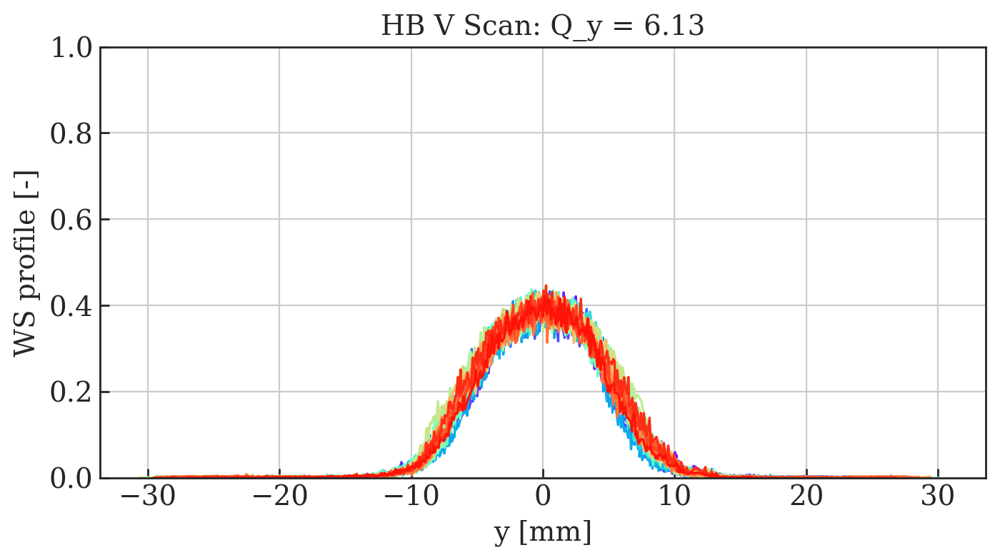

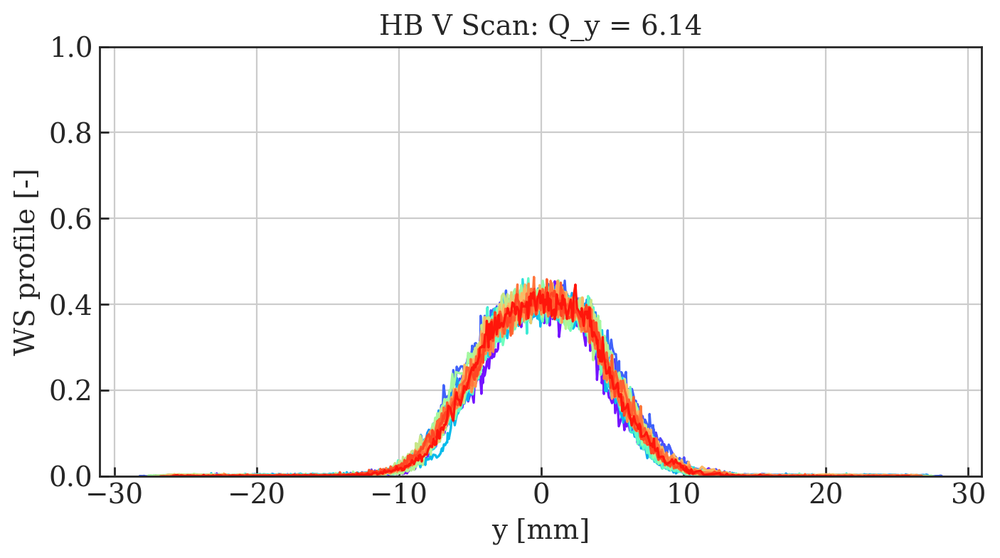

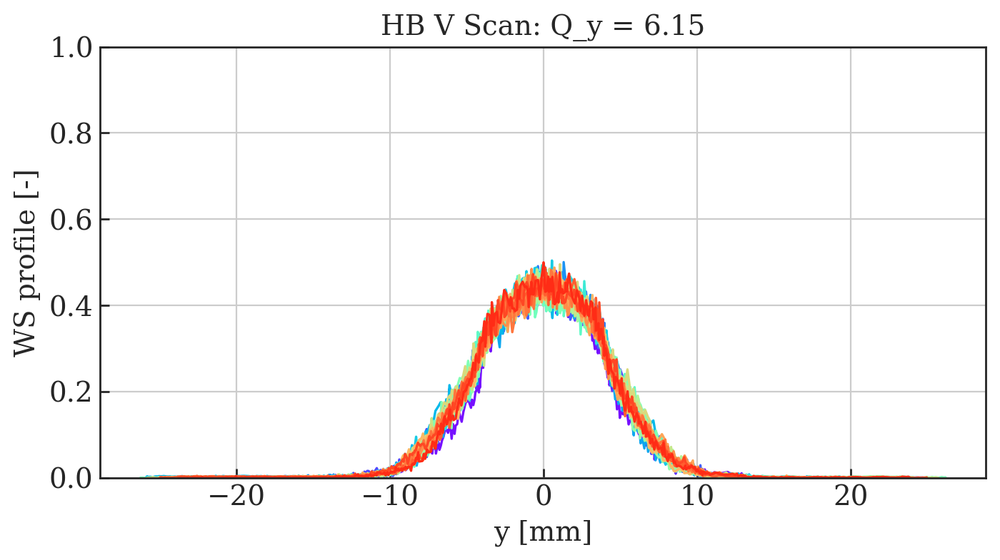

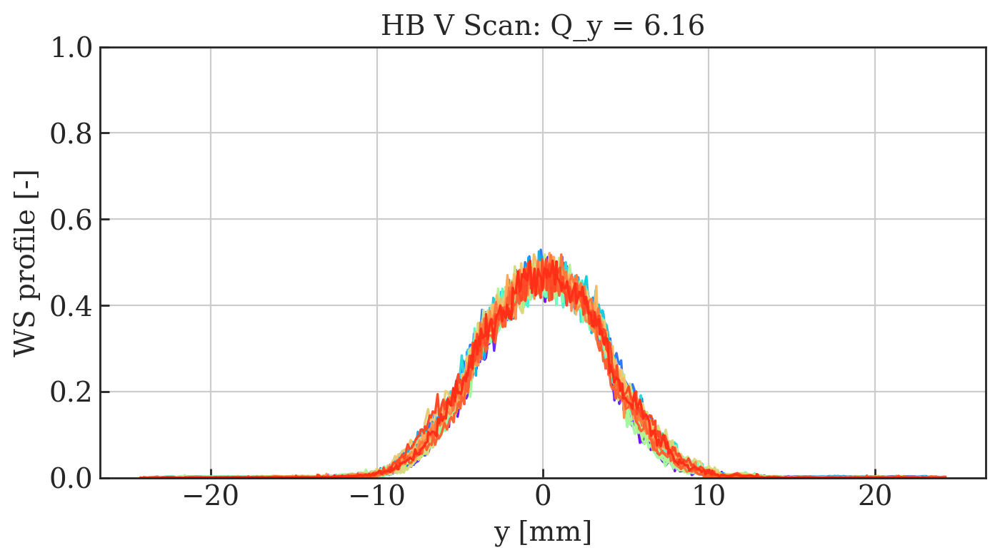

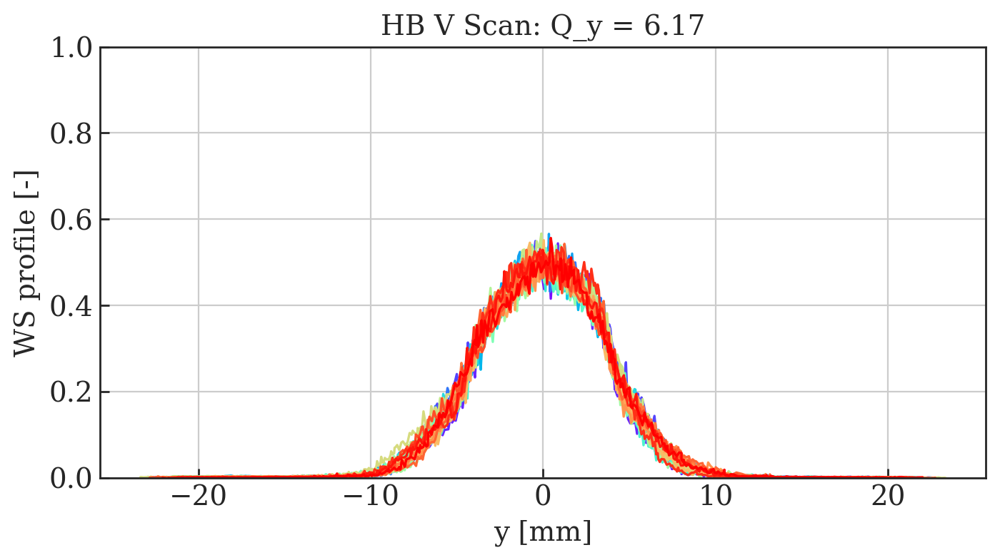

...

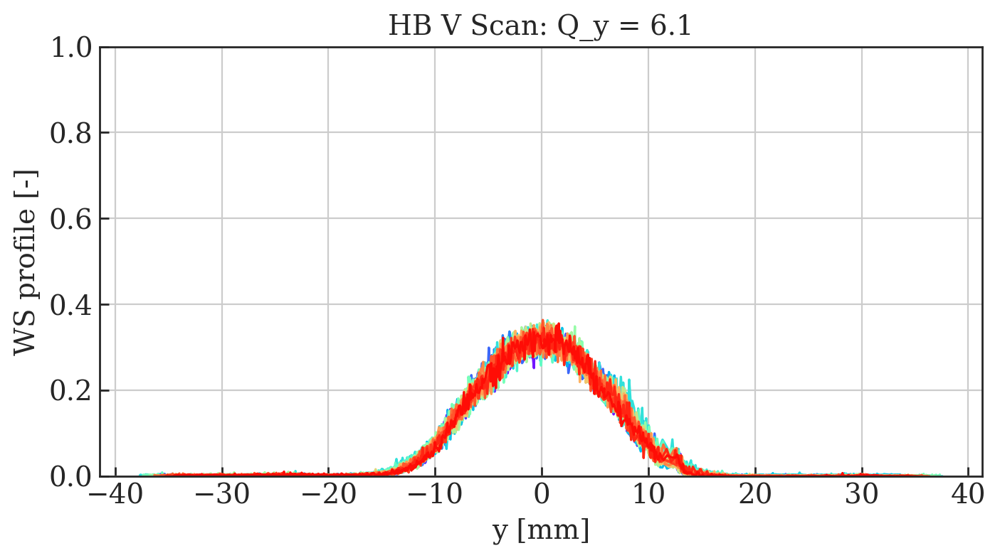

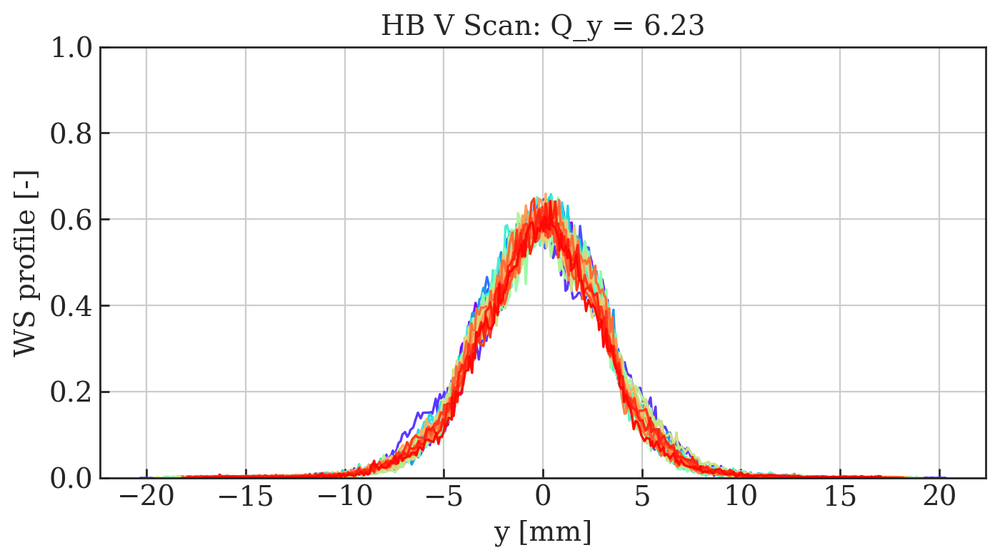

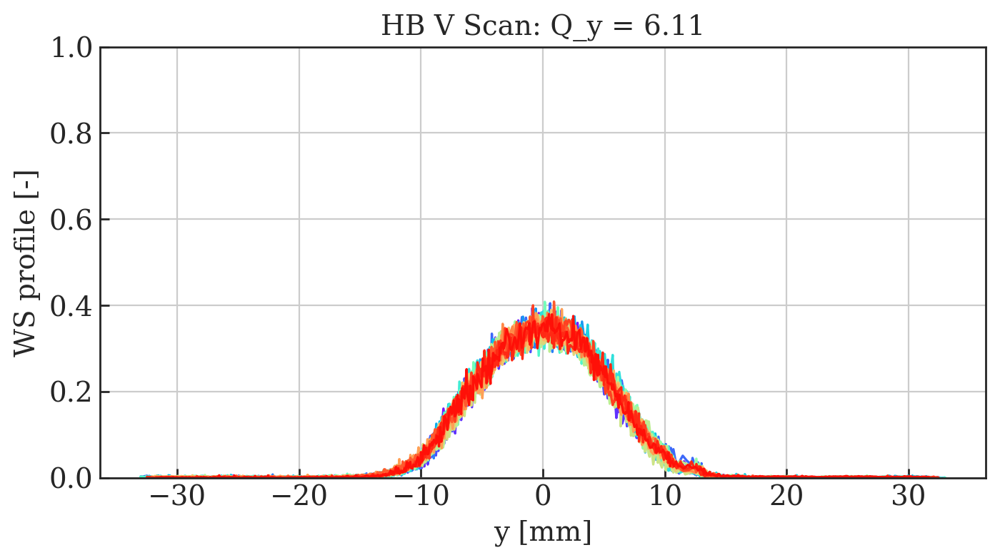

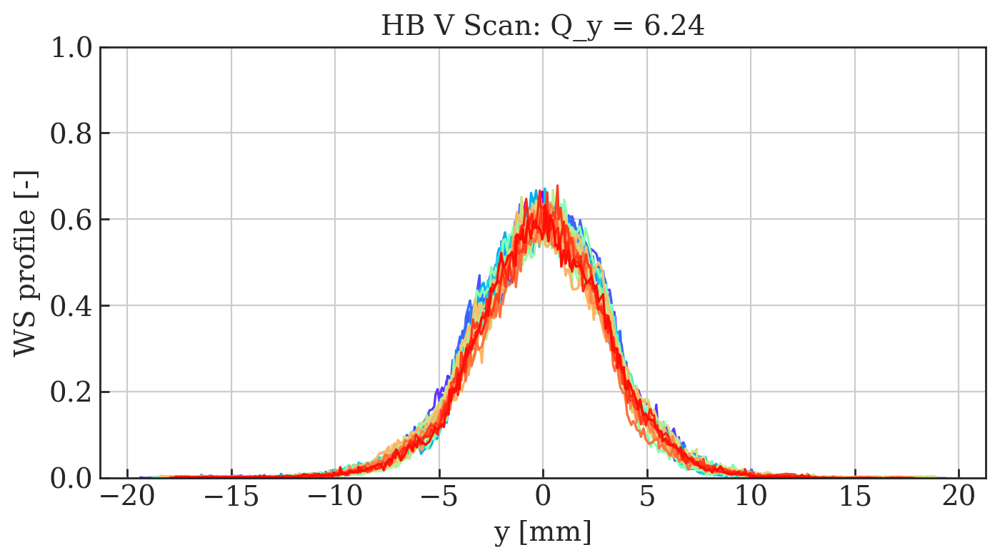

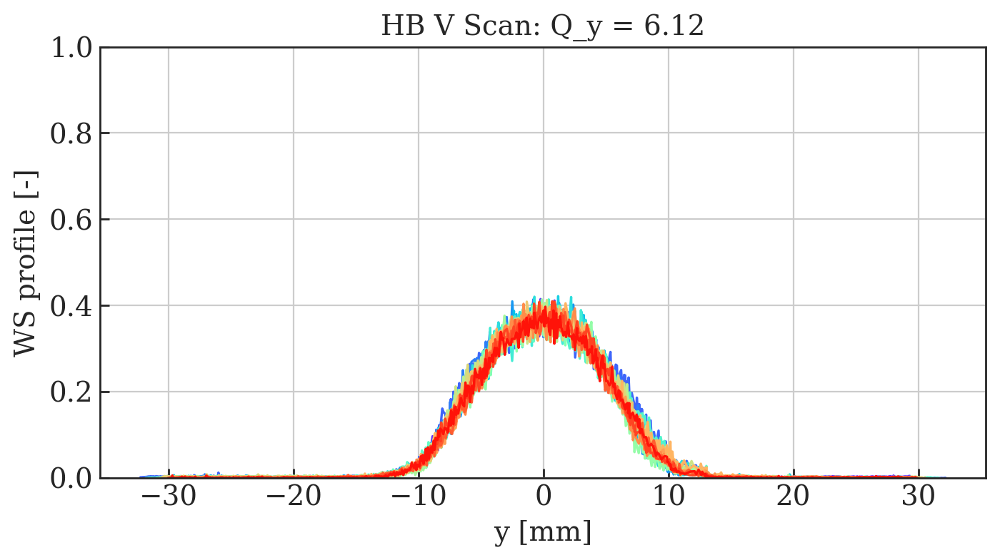

In [53]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['position V'].iloc[value[i]], df0['profile V'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('y [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_y = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Vertical_Manual_Fit_WS_Profiles_Qy=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

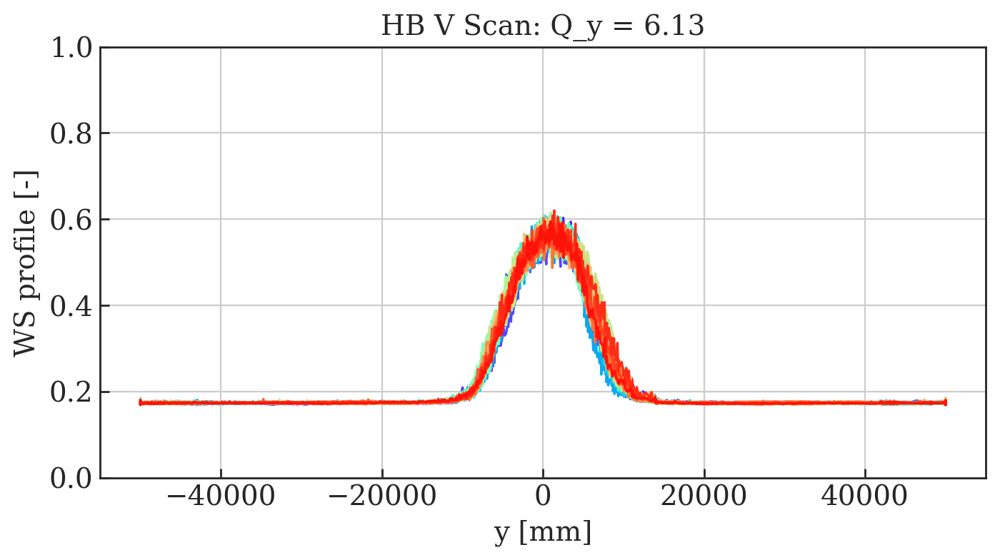

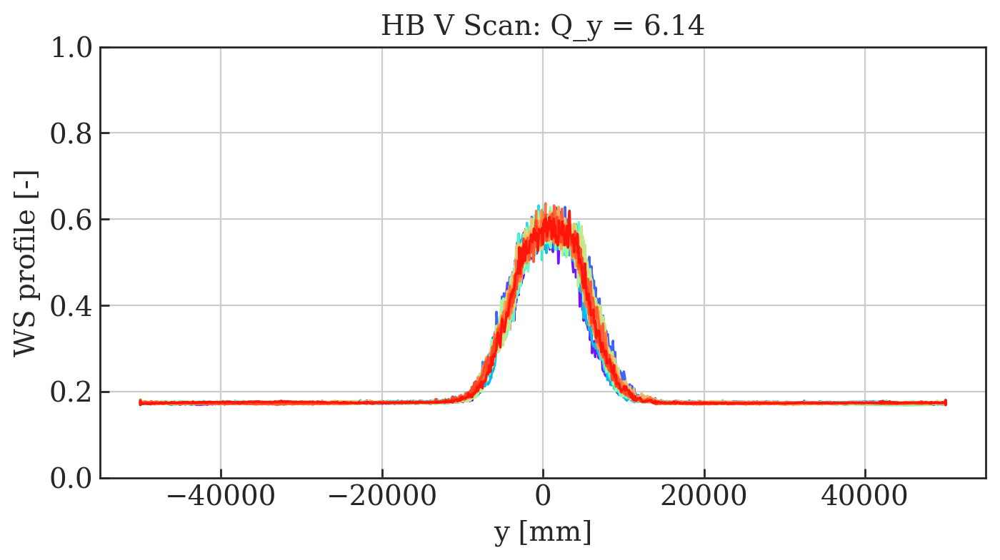

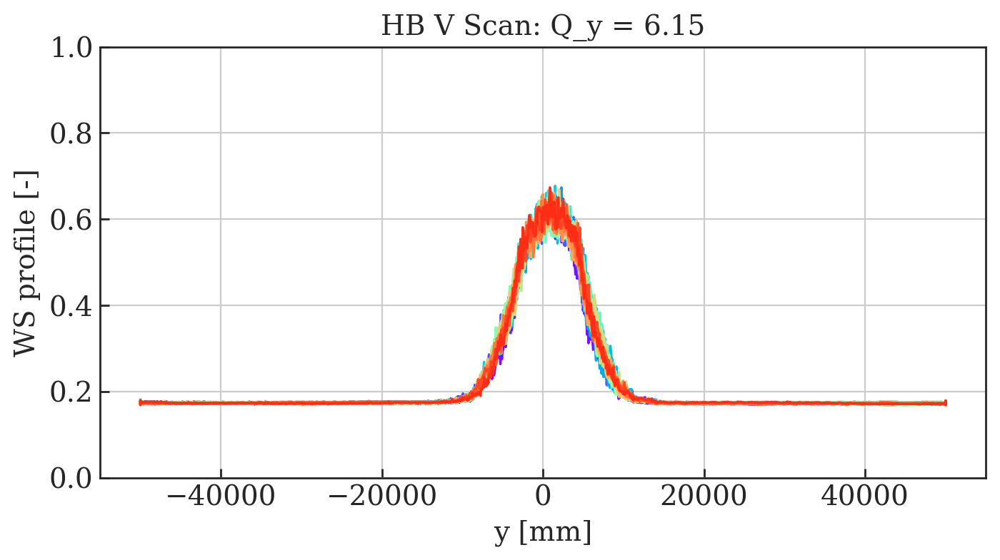

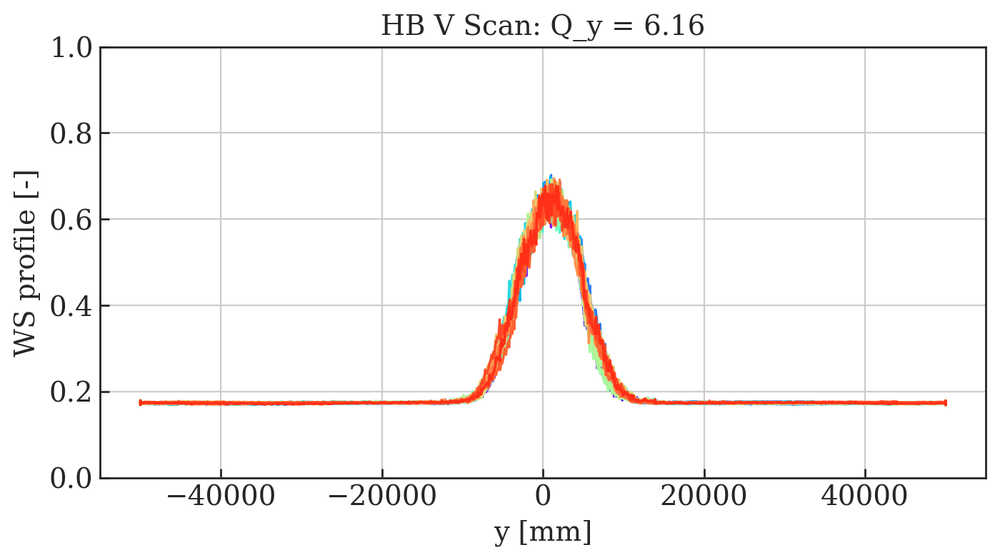

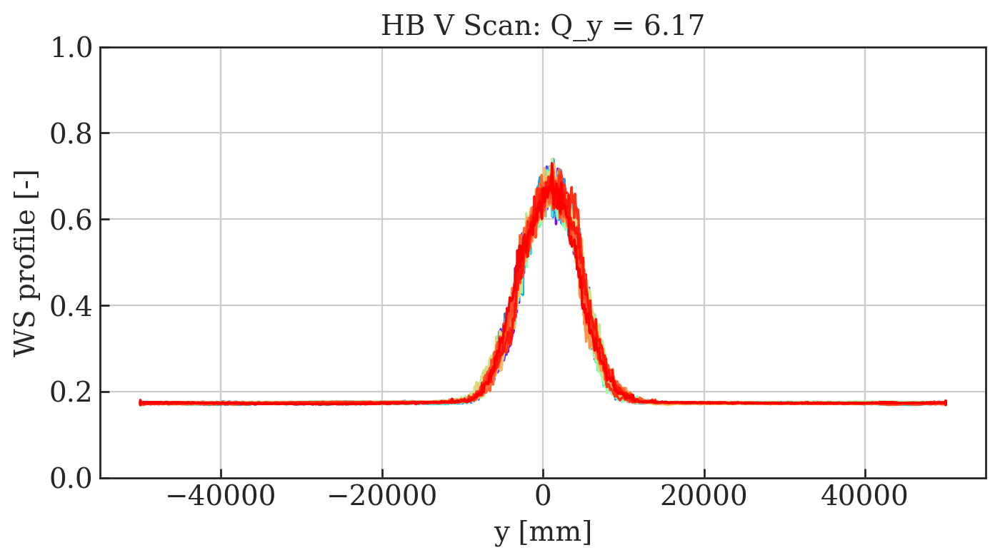

...

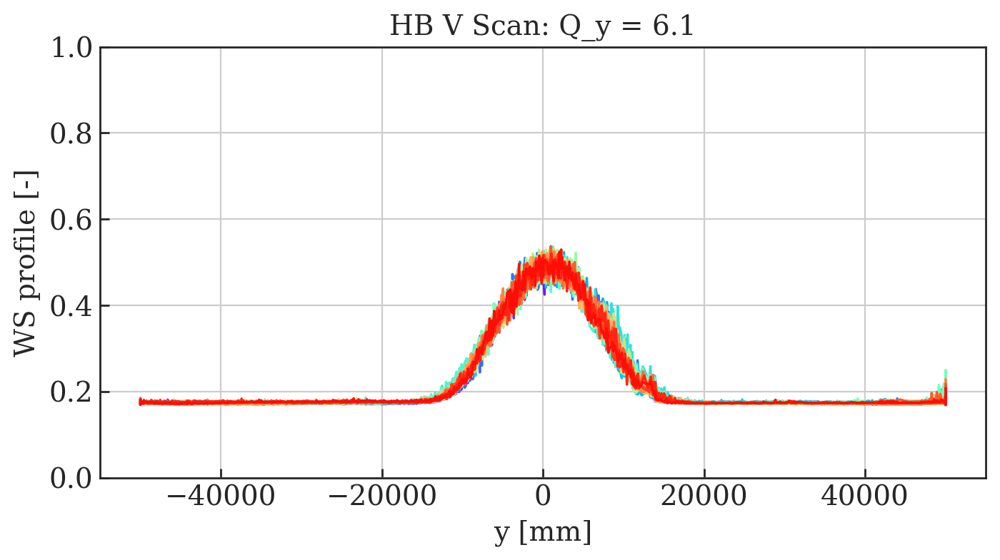

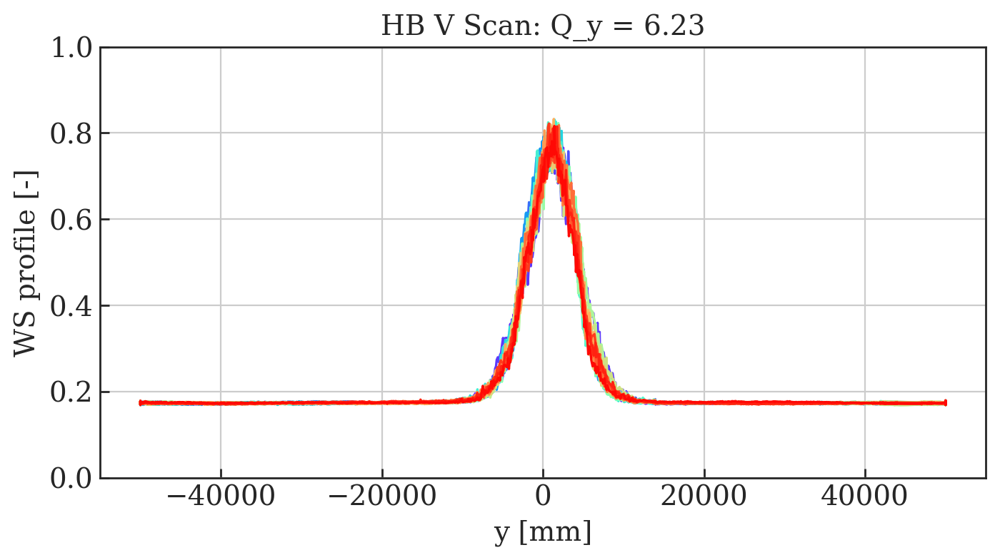

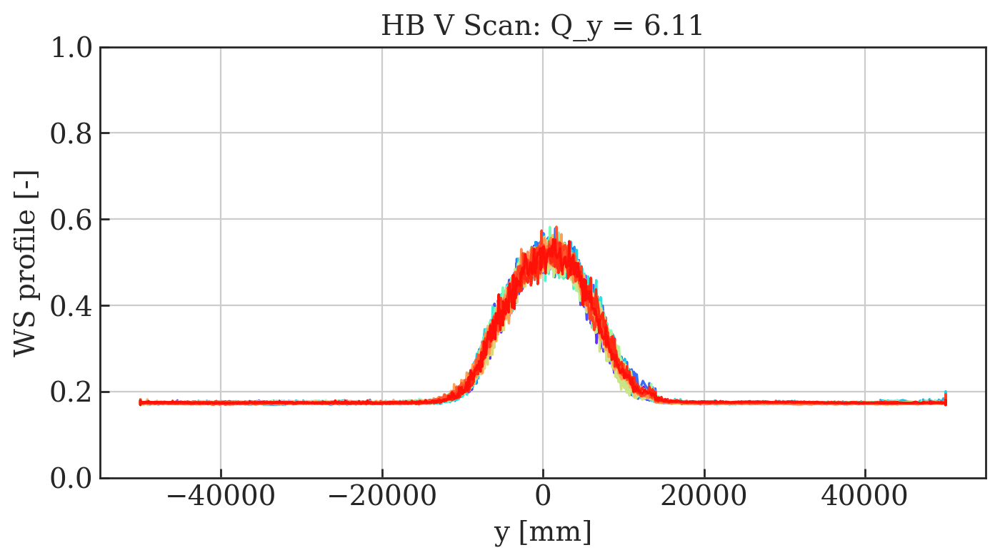

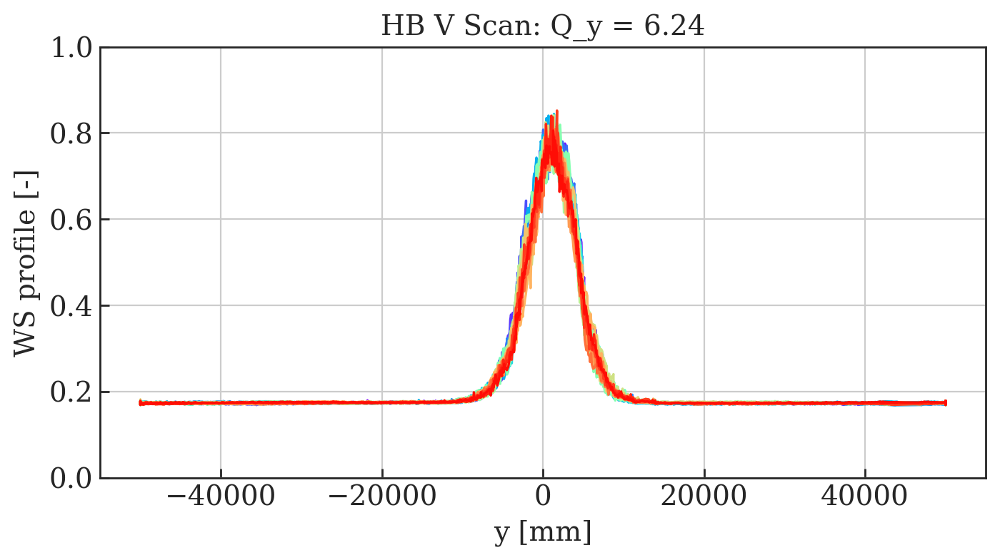

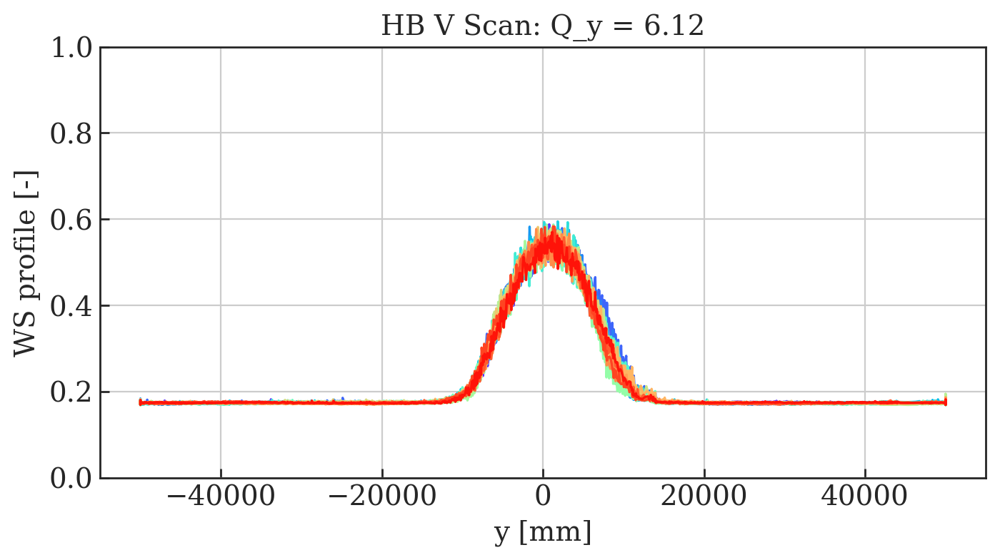

In [54]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['PR.BWS.64.V_ROT:PROF_POSITION_IN'].iloc[value[i]], df0['PR.BWS.64.V_ROT:PROF_DATA_IN'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('y [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_y = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Vertical_Manual_Fit_WS_Profiles_Raw_Qy=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

## Plot Vertical emittance

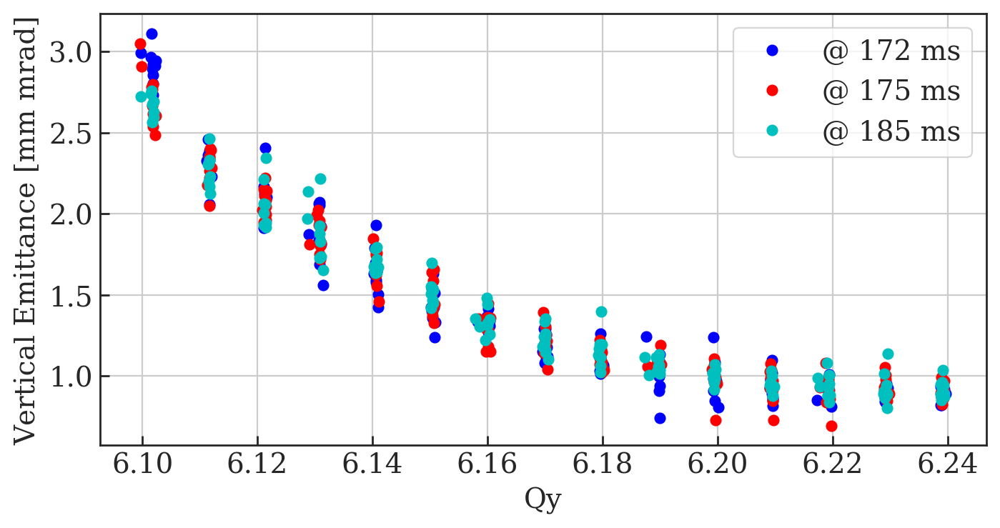

In [55]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
#plt.ylim(0,5);
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Using_Sim_Optics.png');

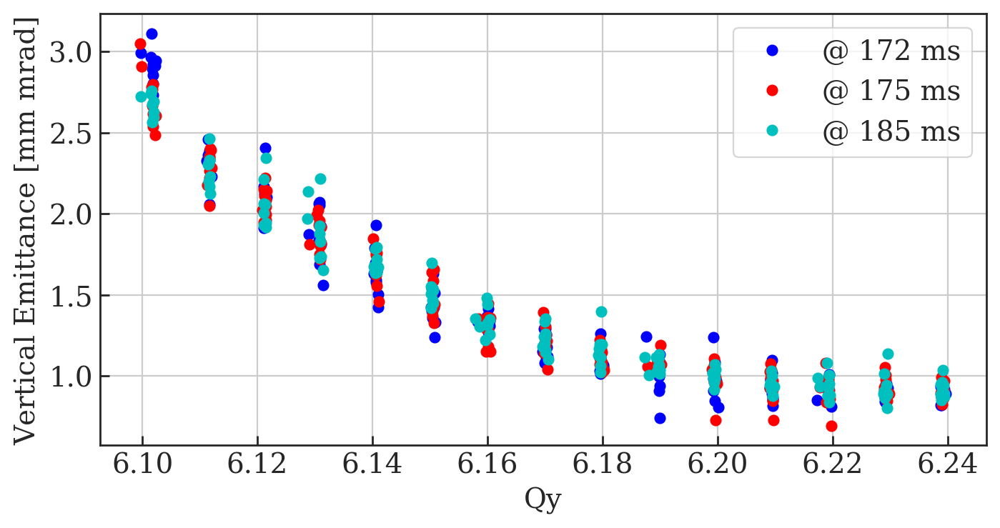

In [56]:
# Plot each shot: Qy vs Ey

fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
#plt.ylim(0,5);
plt.grid();
fig.savefig('MD4224_Horizontal_WS_Delay_Emittance_Using_Sim_Optics.png');

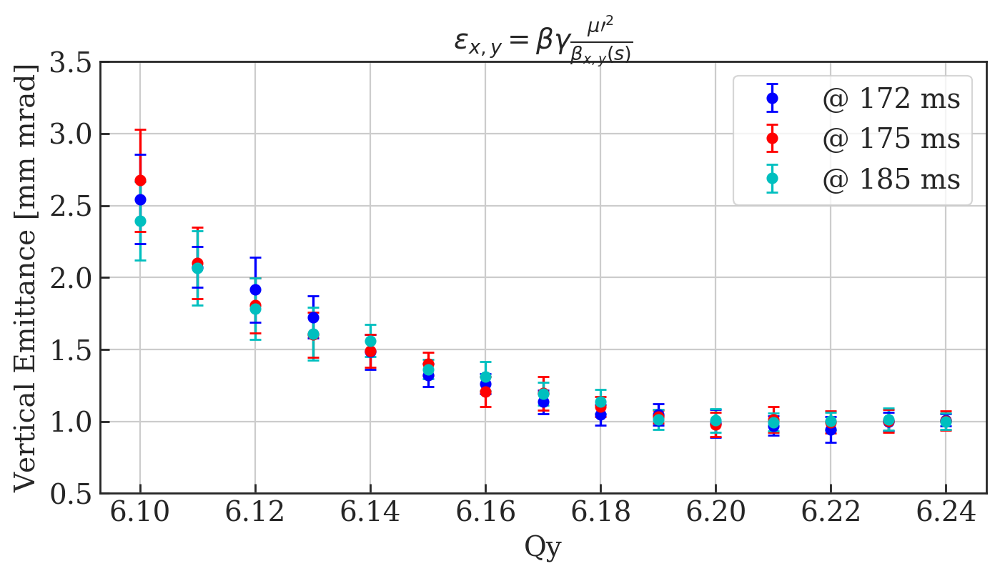

In [57]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 3.5)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics.png');

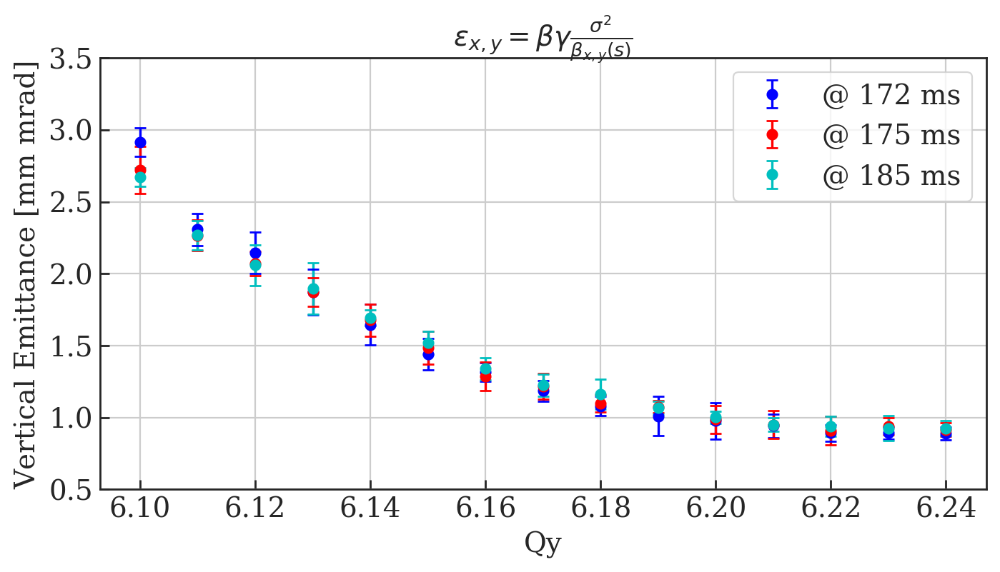

In [58]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 3.5)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics.png');

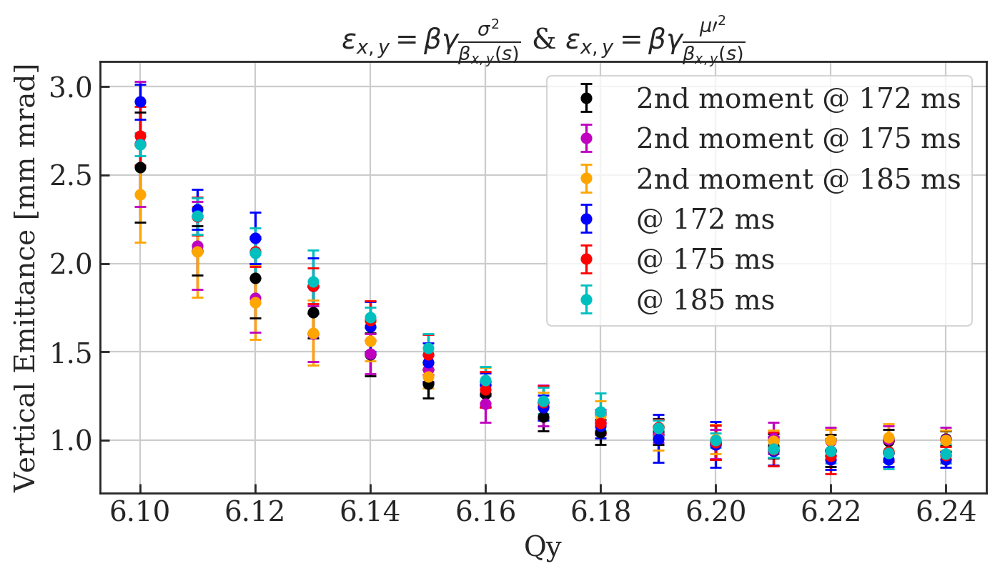

In [59]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_data_1722.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$ & $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_both_Errors_Using_Sim_Optics.png');

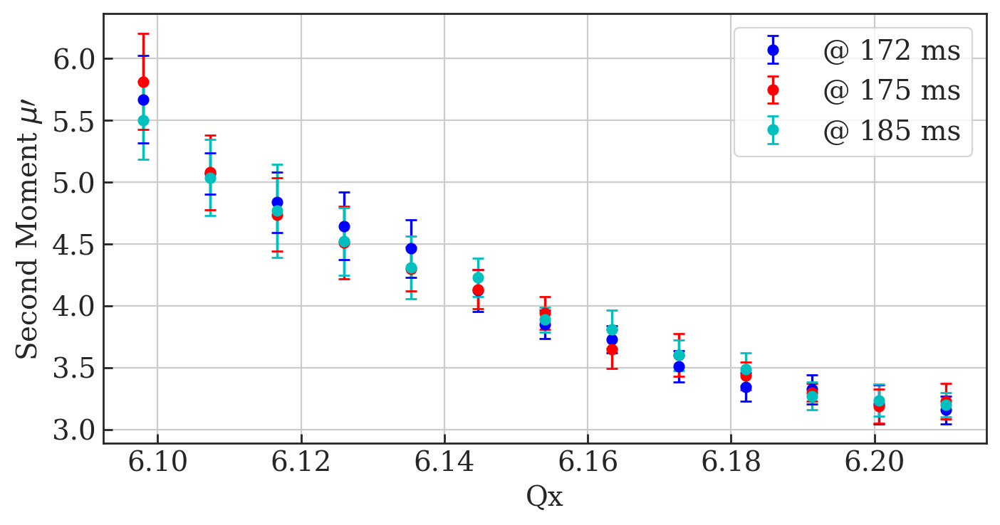

In [60]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_2nd_Moment_Errors_Using_Sim_Optics.png');

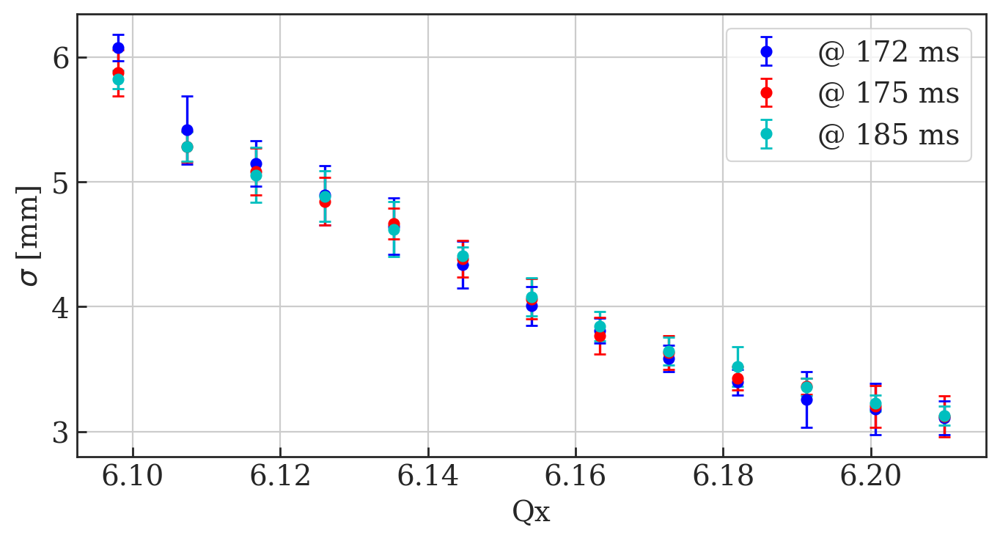

In [61]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'$\sigma$ [mm]');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Sigma_Errors_Using_Sim_Optics.png');

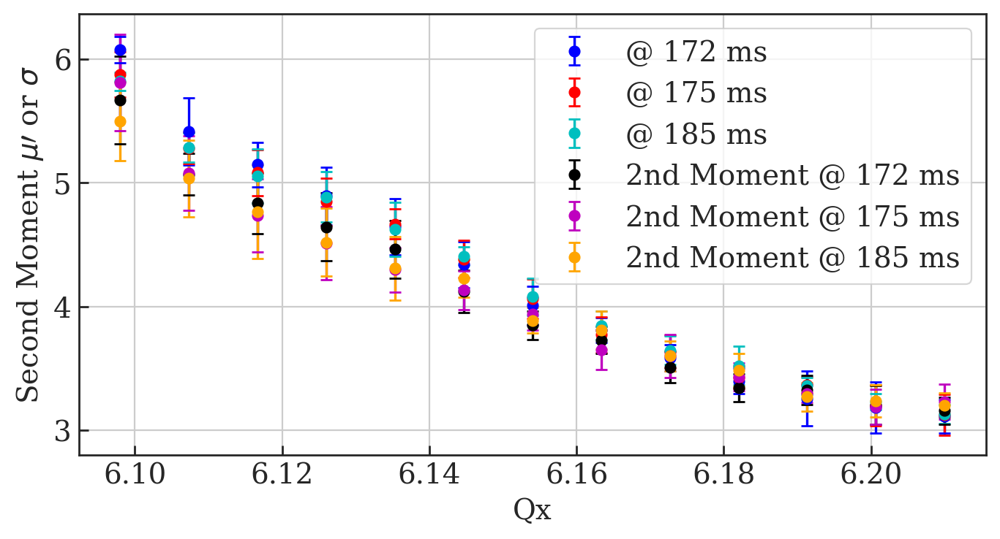

In [62]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_1722.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_data_172.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd Moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd Moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd Moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$ or $\sigma$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_2nd_Moment_and_Sigma_Errors_Using_Sim_Optics.png');

In [63]:
np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>.05)][(df0['Qy']<.1045)] )

2.914127687205493

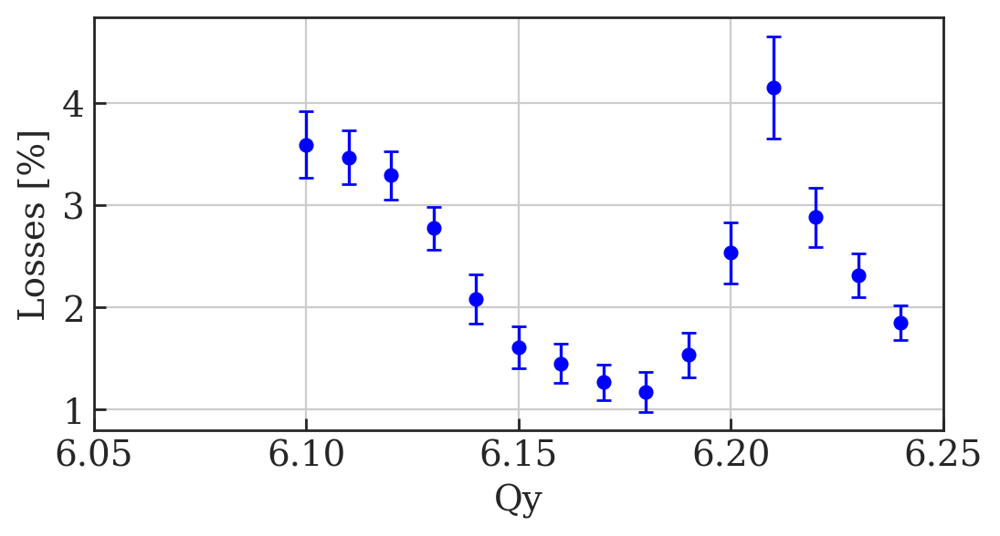

In [64]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['losses'][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['losses'][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.xlabel('Qy');
plt.ylabel('Losses [%]');
plt.xlim(6.05, 6.25)

#plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Losses_Errors_Using_Sim_Optics.png');

# Load Distributions From Simulation Data

In [65]:
import matplotlib.gridspec as gridspec
from math import log10, floor
import matplotlib.cm as cm
import scipy.io as sio 
import numpy as np
import glob

# Read filename, import data
def particles_from_matfile(filename):
    d = dict()
    sio.loadmat(filename, mdict=d)
    return d

# round to n significant figures
def round_sig(x, sig=4):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [66]:
# Read .mat files into a dictionary

matfiles = glob.glob("3_May/*.mat")
sims = dict()

for f in matfiles:
    first = f.split('/')[1]
    second = first.split('.')[0]
    sims[str(second)] = f
    
sims

{'610_SbS_c172': '3_May/610_SbS_c172.mat',
 '612_SbS_c172': '3_May/612_SbS_c172.mat',
 '614_SbS_c172': '3_May/614_SbS_c172.mat',
 '616_SbS_c172': '3_May/616_SbS_c172.mat',
 '618_SbS_c172': '3_May/618_SbS_c172.mat',
 '620_SbS_c172': '3_May/620_SbS_c172.mat',
 '622_SbS_c172': '3_May/622_SbS_c172.mat',
 '624_SbS_c172': '3_May/624_SbS_c172.mat'}

# Dictionary of tune points

In [67]:
# These are our tune points:
scan_points = np.linspace(610, 624, 15);
scan_points = scan_points/100;

Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
print Qy_points

[6.1, 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2, 6.21, 6.22, 6.23, 6.24]


In [68]:
# Make dictionary of nearest tune point and iterators
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qy'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qy'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

Tune points separated by +/-  0.005


{6.1: array([ 13,  28,  42,  57,  72,  99, 114, 129, 144, 159, 173, 186, 201,
        214, 228, 243, 258, 272, 286, 300, 314, 329, 343, 356, 371, 384,
        397, 410]),
 6.11: array([ 12,  27,  41,  56,  71,  86,  98, 113, 128, 143, 158, 172, 200,
        227, 242, 257, 271, 285, 299, 313, 328, 342, 370, 383, 396, 409]),
 6.12: array([ 26,  55,  70,  85, 112, 127, 142, 157, 171, 185, 199, 213, 226,
        241, 256, 270, 284, 298, 312, 327, 341, 369, 382, 408]),
 6.13: array([ 11,  25,  40,  54,  69,  84,  97, 111, 126, 141, 156, 170, 184,
        198, 212, 225, 240, 255, 269, 283, 297, 311, 326, 340, 355, 368,
        381, 395, 407]),
 6.14: array([ 10,  24,  39,  53,  68,  83,  96, 110, 125, 140, 155, 169, 183,
        197, 211, 224, 239, 254, 268, 296, 310, 325, 339, 354, 367, 380,
        406]),
 6.15: array([  9,  23,  38,  52,  67,  82,  95, 109, 124, 139, 154, 182, 196,
        210, 223, 238, 253, 267, 282, 295, 309, 324, 338, 353, 366, 379,
        394]),
 6.16: array([  8,  

# Function to find Peak

In [69]:
def peakfinder (x_dat, y_dat, tolerance = 1, verbose=False):
    
    # Find maximum
    max_y = max(y_dat)
    if verbose: print '\n\tMAX(y_dat) = ', max_y   
    
    # Assume peak as centre
    index = np.where(y_dat == max_y)[0][0]

    # Check if centre is near 0.0
    if abs(x_dat[index]) < tolerance:
        if verbose: print '\tx_dat[index] = ', x_dat[index]
    
    # Manually find 0 index
    else:
        if verbose: print '\tindex from y_dat peak not within tolerance of',tolerance,'mm. \n\ttry manual search'
        
        index = -1
        final_index = -1
        for i in xrange(len(x_dat)):
            index = index + 1
            if x_dat[i] < 0.0:
                final_index = index
                break
                
        index = final_index
        if verbose: print '\tindex = ', index       
       
    if verbose: print '\tindex of x_dat = ', x_dat[index],' is ', index
        
    # Take y=0 +/- 3 points and find mean 
    mean_dat = [y_dat[index-3],  y_dat[index-2],  y_dat[index-1], y_dat[index],  y_dat[index+1],  y_dat[index+2],  y_dat[index+3]]
    mean_7 = np.mean(mean_dat)
    if verbose: print '\tMean of peak point +/- 3 points = ', mean_7   
    
    if abs( abs(mean_7 - max_y) / mean_7 ) > 0.2:
        print '\tWARNING: difference between mean and max_y > 20% = ', abs( abs(mean_7 - max_y) / mean_7 )
        print '\t using peak value'
        mean_7 = max_y
    return mean_7

# Test Peakfinder

In [70]:
peak = peakfinder(np.array(df0['position V'].iloc[0]), np.array(df0['profile V'].iloc[0]),tolerance = 0.01, verbose=True)
print peak



	MAX(y_dat) =  0.6638534591783954
	index from y_dat peak not within tolerance of 0.01 mm. 
	try manual search
	index =  192
	index of x_dat =  -0.03379243863650805  is  192
	Mean of peak point +/- 3 points =  0.638239823191498
0.638239823191498


peak @ 67.27637102620673


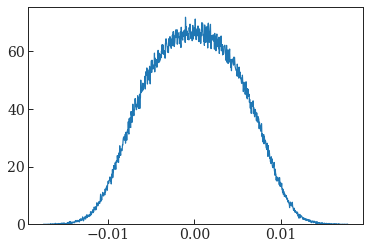

In [71]:
d = particles_from_matfile('3_May/610_SbS_c172.mat')
plt.clf()
x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')
    
    
peak = peakfinder(np.array(bins_[:-1]), np.array(x))
print 'peak @', peak

plt.plot(bins_[:-1], x);

# Check all simulation data peaks

In [72]:
for key, value in sorted(sims.iteritems()):
    print value
    d = particles_from_matfile(value)
    plt.clf()
    x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')

    peak = peakfinder(np.array(bins_[:-1]), np.array(x), verbose=True)
    print '\n peak = ', peak, '\n'
    plt.close()

3_May/610_SbS_c172.mat

	MAX(y_dat) =  71.68873708334758
	x_dat[index] =  -0.001011069237171161
	index of x_dat =  -0.001011069237171161  is  466
	Mean of peak point +/- 3 points =  67.27637102620673

 peak =  67.27637102620673 

3_May/612_SbS_c172.mat

	MAX(y_dat) =  83.87082355393272
	x_dat[index] =  -0.00011689135720624813
	index of x_dat =  -0.00011689135720624813  is  518
	Mean of peak point +/- 3 points =  78.84902218381808

 peak =  78.84902218381808 

3_May/614_SbS_c172.mat

	MAX(y_dat) =  96.81536486740951
	x_dat[index] =  0.00046847950432734806
	index of x_dat =  0.00046847950432734806  is  516
	Mean of peak point +/- 3 points =  91.54008229271778

 peak =  91.54008229271778 

3_May/616_SbS_c172.mat

	MAX(y_dat) =  113.44469233578047
	x_dat[index] =  0.0005471706526786677
	index of x_dat =  0.0005471706526786677  is  505
	Mean of peak point +/- 3 points =  108.21801786593583

 peak =  108.21801786593583 

3_May/618_SbS_c172.mat

	MAX(y_dat) =  122.23559185615062
	x_dat[index]

# Plot wirescanner profiles with simulation data

In [73]:
# Function to plot data:
# d = simulation matfile dictionary
# df = MD dataframe
# md_points = array of dataframe indexes

def Plot_profiles_MD_cf_Sims(d, df, md_points, main_label = '', bins=1000, sim_label='sim', md_label='MD'):
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    multi = 1/1E-3
    
    plt.clf()
    x, bins_, p = plt.hist(d['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='k')
    
    for i in md_points:
        
        # Normalisation so all plots peak at y=1
        df_norm = 1/peakfinder(np.array(df0['position V'].iloc[i]), np.array(df0['profile V'].iloc[i]))
        sim_norm = 1/peakfinder(np.array(bins_[:-1]), np.array(x))
        
        lab = md_label + str(i)
        plt.plot(df0['position V'].iloc[i], np.array(df0['profile V'].iloc[i])*df_norm, color=colors[i], label = md_label, lw=0.5)
  
    bins_ = np.array(bins_[:-1]) + (abs(bins_[0]-bins_[1])/2)

    plt.plot(bins_, x*sim_norm, lw=2, color='k', label=sim_label)
    
    
    plt.ylabel('Arbitrary Unit')
    plt.xlabel('y [mm]')
    plt.legend(fontsize='x-small')
    plt.grid();
    plt.title(main_label)
    savename = main_label + '.png'
    fig.savefig(savename);


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms]
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms]
[55, 142, 185, 226, 270, 312]

Importing simulation file: 614_SbS_c172
Qy =  6.14 , ctime = 172.0 [ms]
[10, 53, 96, 140, 183, 224, 268, 310, 354]

Importing simulation file: 616_SbS_c172
Qy =  6.16 , ctime = 172.0 [ms]
[8, 51, 94, 138, 181, 222, 266, 308, 352, 393]

Importing simulation file: 618_SbS_c172
Qy =  6.18 , ctime = 172.0 [ms]
[6, 49, 92, 136, 179, 220, 264, 306, 350, 391]

Importing simulation file: 620_SbS_c172
Qy =  6.2 , ctime = 172.0 [ms]
[4, 47, 90, 134, 177, 305, 348, 389]

Importing simulation file: 622_SbS_c172
Qy =  6.22 , ctime = 172.0 [ms]
[2, 45, 132, 175, 217, 261, 303, 346, 387]

Impor

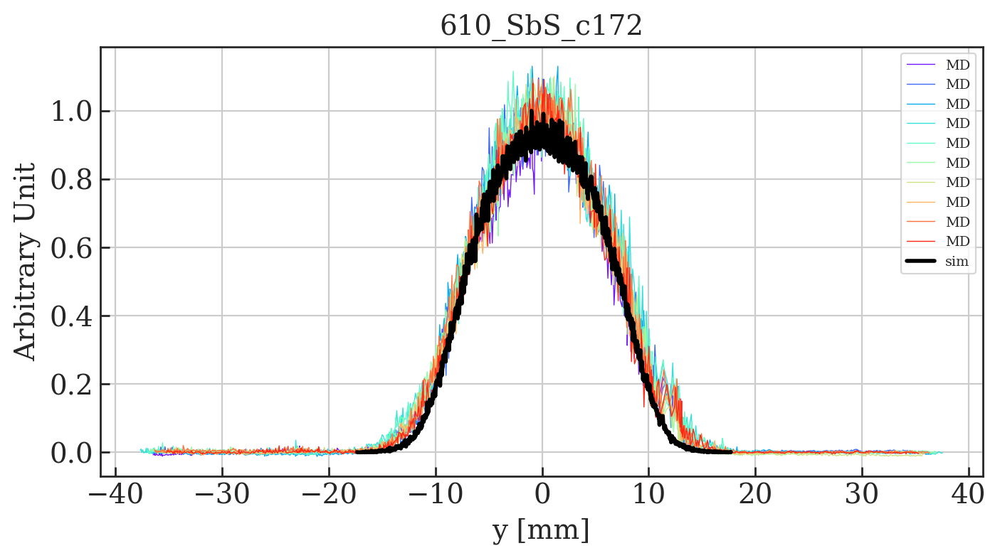

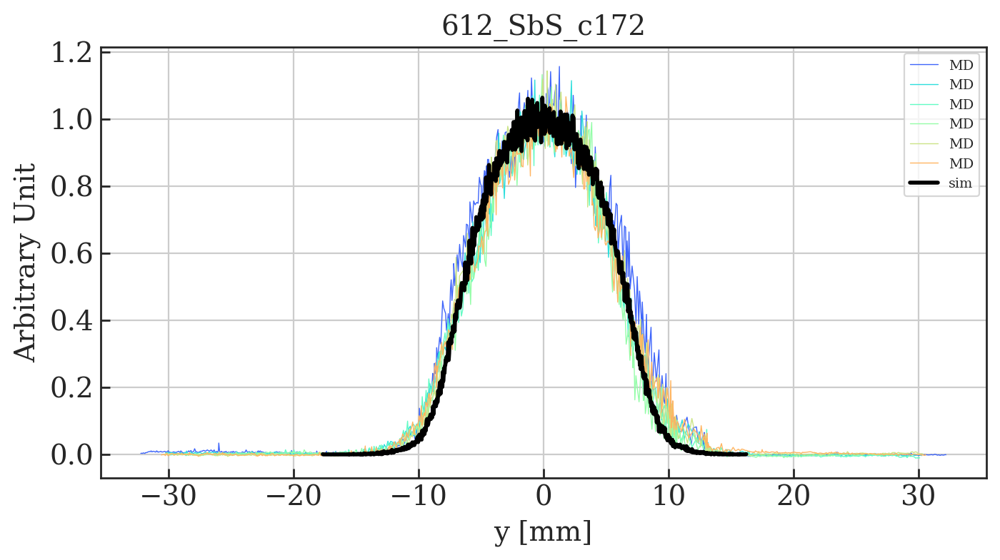

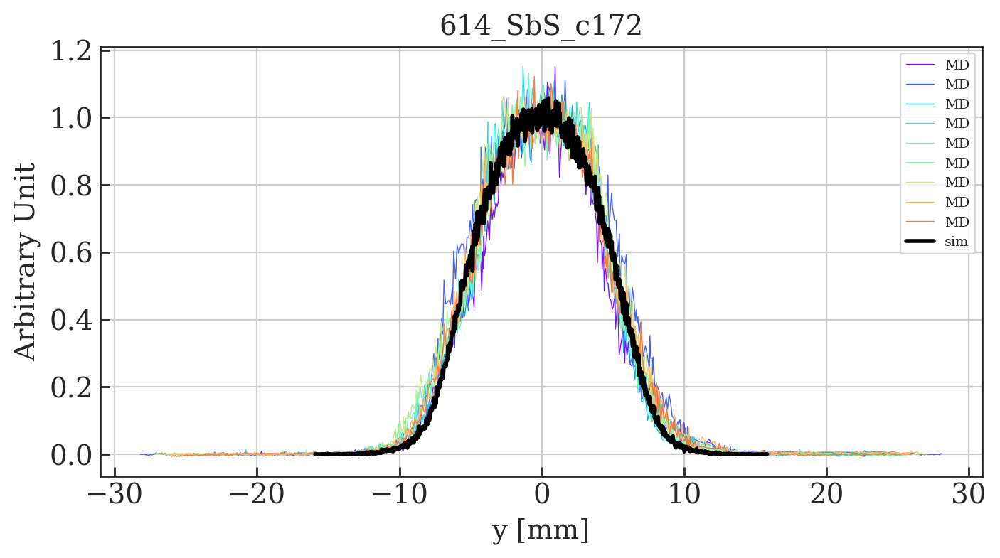

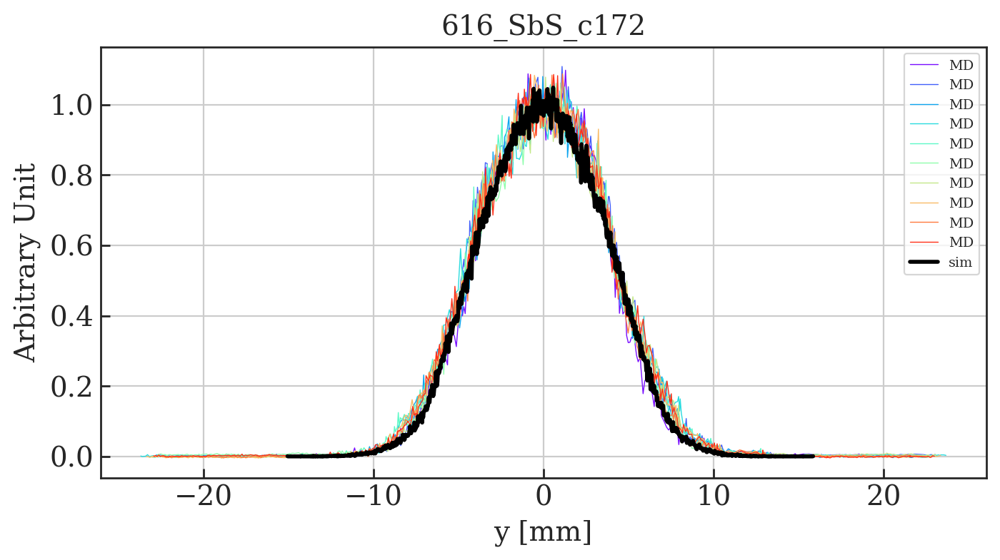

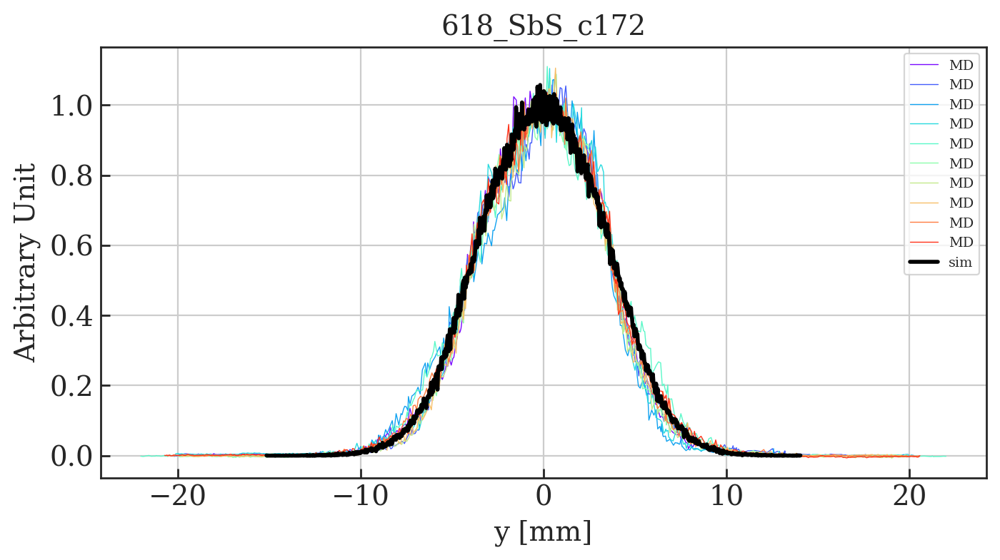

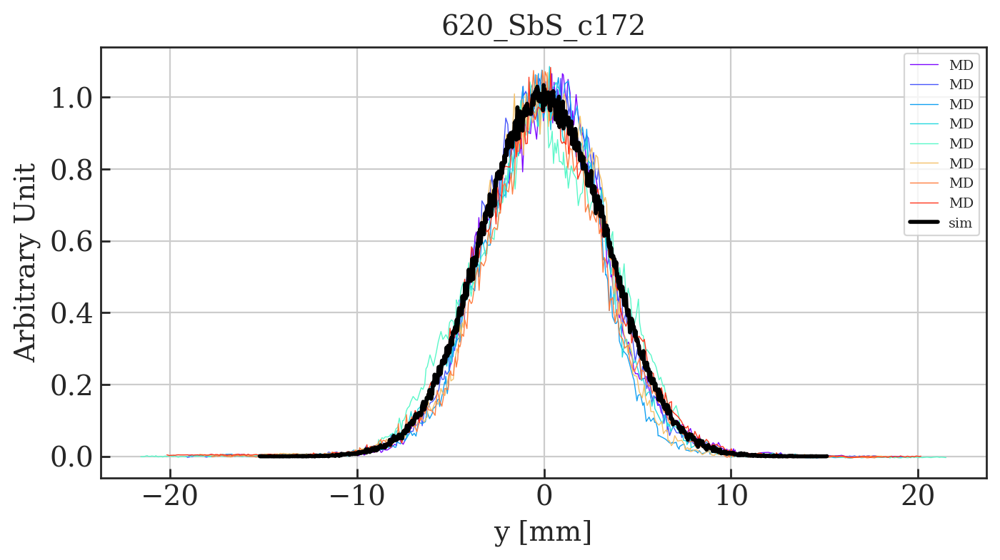

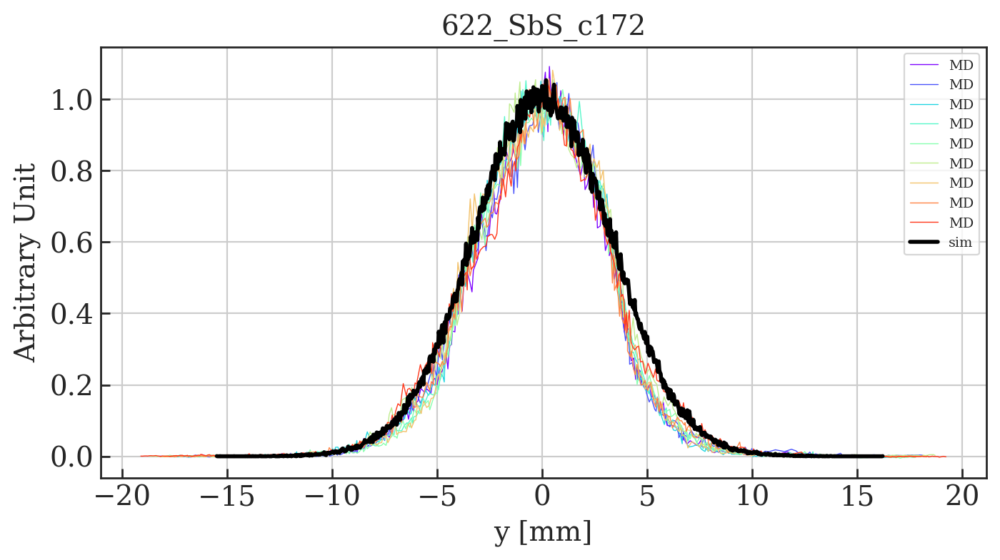

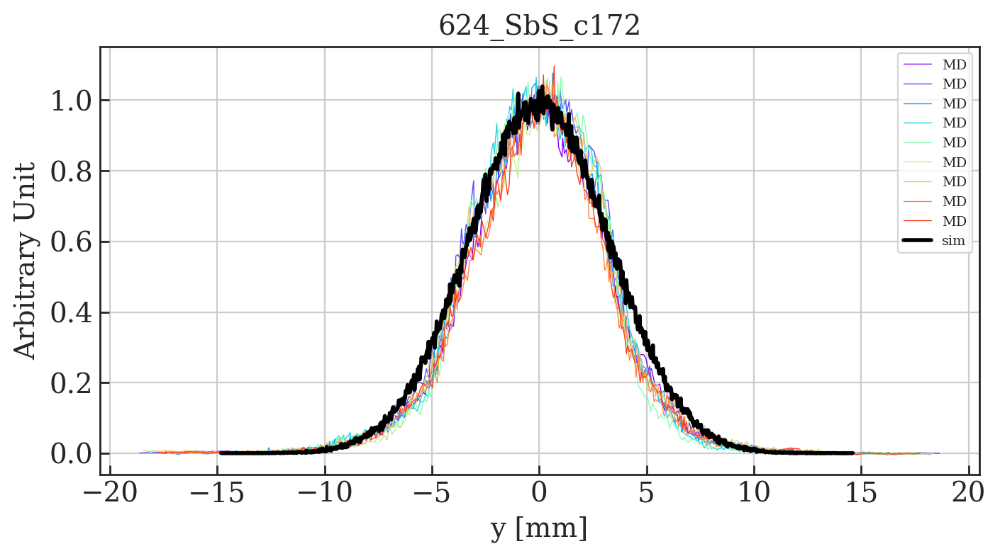

In [74]:
#Main function
verbose = True

for key, value in sorted(sims.iteritems()):
    if verbose: print '\nImporting simulation file:', key
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms]'
        
    d = particles_from_matfile(value)
        
    # Find MD data with same tune and ctime
    
    md_points = []
    for i in tune_points[tune_y]:
        if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
            md_points.append(i)
            
    if verbose: print md_points
        
    # Plot data
    main_label = key
    Plot_profiles_MD_cf_Sims(d, df0, md_points, main_label)  

In [75]:
def Plot_profiles_cf_sc_models(df, md_points, d1, d2=None, d3=None, main_label = '', bins=1000, sim_labels=None, md_label='MD', plot_md=False):
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    multi = 1/1E-3
    
    if sim_labels is None:
        if d2 is not None:
            sim_labels = ['2.5D','nLK']
        elif d3 is not None:
            sim_labels = ['2.5D','nLK','SbS']            
        else:
            sim_labels = ['2.5D']
    
    plt.clf()
    x1, bins_1, p1 = plt.hist(d1['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='k')
    
    if d2 is not None:
        plt.clf()
        x2, bins_2, p2 = plt.hist(d2['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='r')
        
        if d3 is not None:
            plt.clf()
            x3, bins_3, p3 = plt.hist(d3['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='b')
   
        
    norm1 = 1/peakfinder(np.array(bins_1[:-1]), np.array(x1), verbose=True)
    if d2 is not None: norm2 = 1/peakfinder(np.array(bins_2[:-1]), np.array(x2), verbose=True)
    if d3 is not None: norm3 = 1/peakfinder(np.array(bins_3[:-1]), np.array(x3), verbose=True)
        
    if plot_md:
        for i in md_points:
            # Normalisation so all plots peak at y=1
            multi2 = 1/peakfinder(np.array(df0['position V'].iloc[i]), np.array(df0['profile V'].iloc[i]))
#             multi2 = 1/max(np.array(df0['profile V'].iloc[i]))

            lab = md_label + str(i)
            plt.plot(df0['position V'].iloc[i], np.array(df0['profile V'].iloc[i])*multi2, color=colors[i], label = md_label, lw=0.5)

    bins1 = np.array(bins_1[:-1]) + (abs(bins_1[0]-bins_1[1])/2)
    plt.plot(bins1, x1*norm1, lw=2, color='k', label=sim_labels[0])
    if d2 is not None: 
        bins2 = np.array(bins_2[:-1]) + (abs(bins_2[0]-bins_2[1])/2)
        plt.plot(bins2, x2*norm2, lw=2, color='r', label=sim_labels[1])
    if d3 is not None: 
        bins3 = np.array(bins_3[:-1]) + (abs(bins_3[0]-bins_3[1])/2)
        plt.plot(bins3, x3*norm3, lw=2, color='b', label=sim_labels[2])
    
    
    plt.xlim(-20, 20)
    plt.ylim(-0.05, 1.1)
    
    plt.ylabel('Arbitrary Unit')
    plt.xlabel('y [mm]')
    plt.legend(fontsize='x-small')
    plt.grid();
    plt.title(main_label)
    savename = main_label + '.png'
    fig.savefig(savename);

# Compare SC Models only


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms], label =  SbS
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

	MAX(y_dat) =  0.07168873708334457
	index from y_dat peak not within tolerance of 1 mm. 
	try manual search
	index =  0
	index of x_dat =  -17.3658837826817  is  0
	Mean of peak point +/- 3 points =  2.44226903531713e-05
	 using peak value

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms], label =  SbS
[55, 142, 185, 226, 270, 312]

	MAX(y_dat) =  0.08387082355393713
	x_dat[index] =  -0.11689135720624932
	index of x_dat =  -0.11689135720624932  is  518
	Mean of peak point +/- 3 points =  0.07884902218381876

Importing simulation file: 614_SbS_c172
Qy =  6.14 , ctime = 172.0 [ms], label =  SbS
[10, 53, 96, 140, 183, 224, 268, 310, 354]

	MAX(y_dat) =  0.09681536486741593
	x_dat[index] =  0.4684795043273464
	index of x_dat =  0.4684795043273464  is  516
	Mean of peak point +/- 3 points =  0.09154008229271664

Importing simulation fi

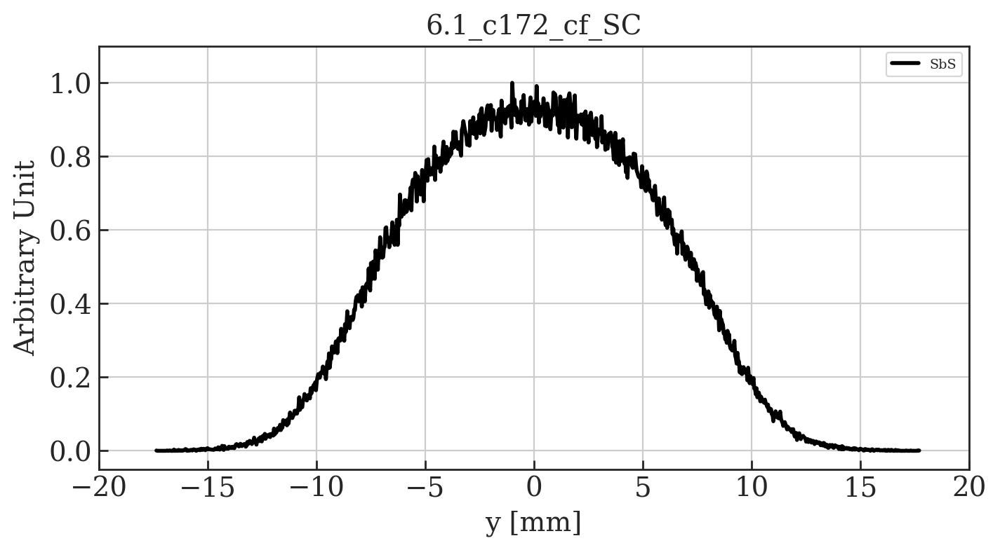

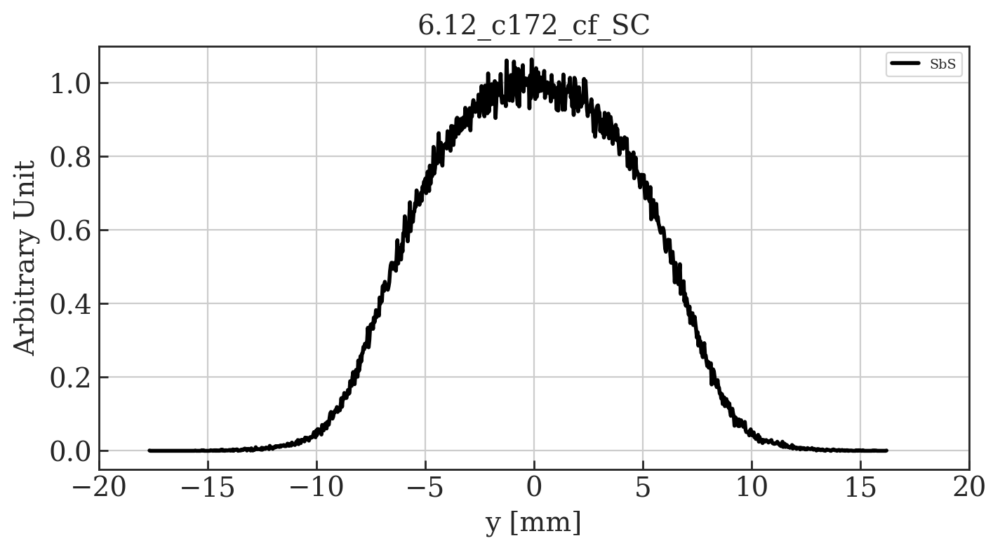

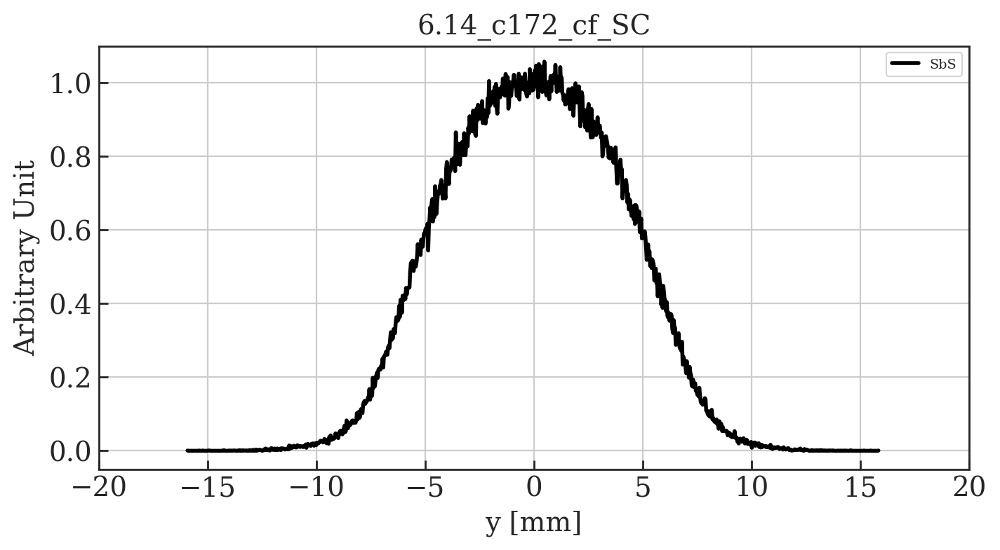

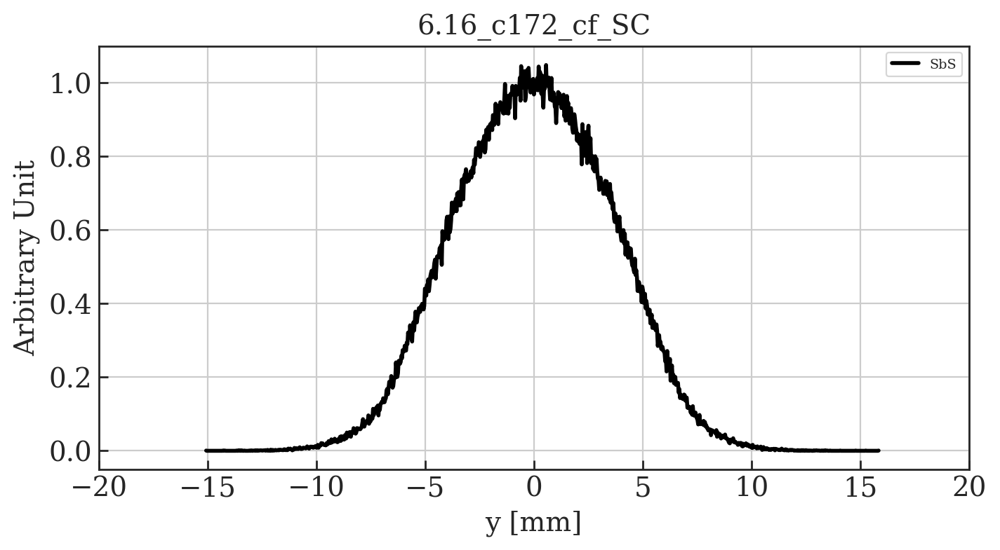

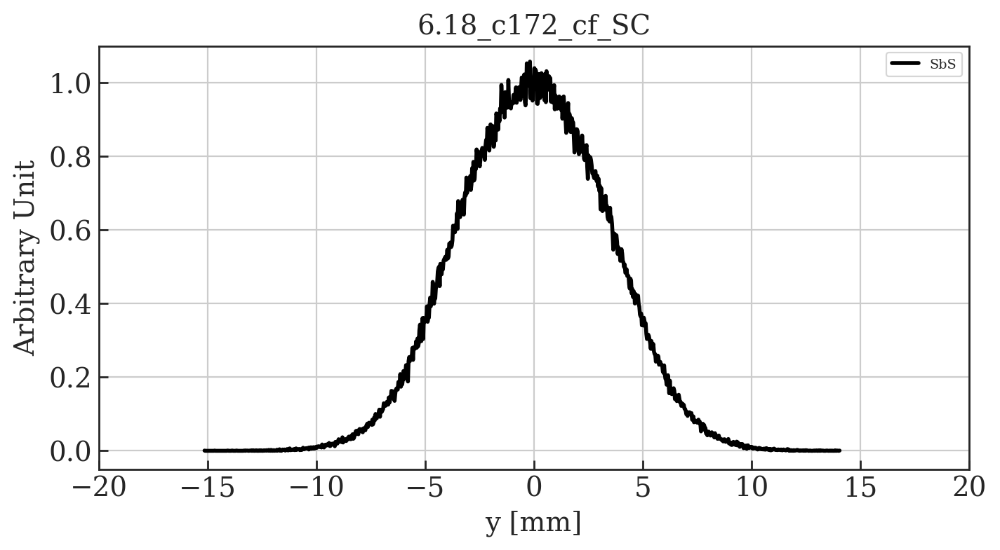

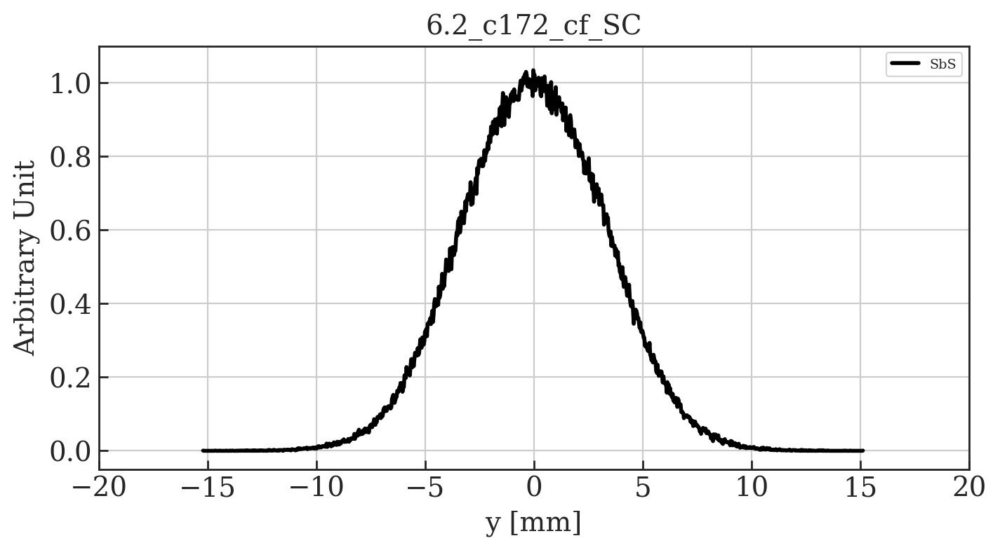

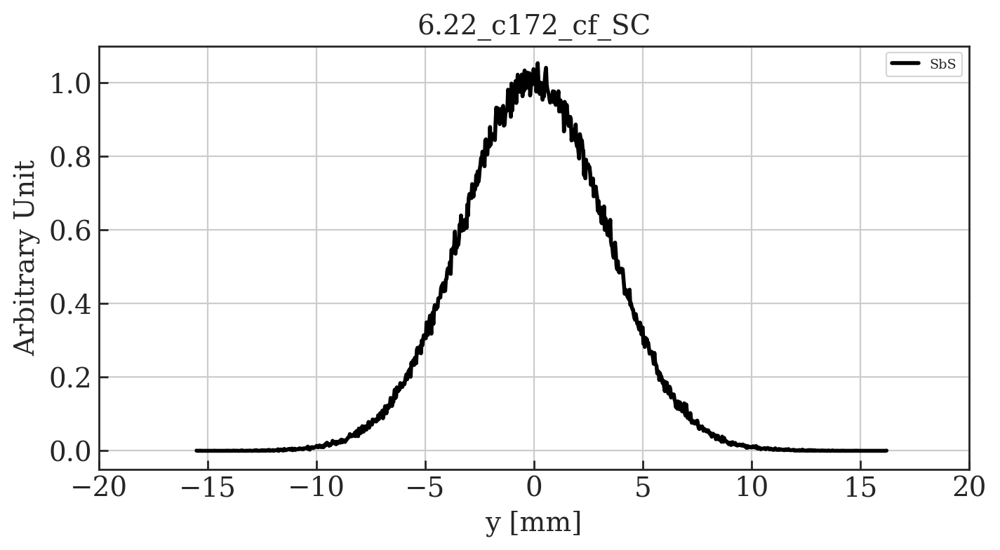

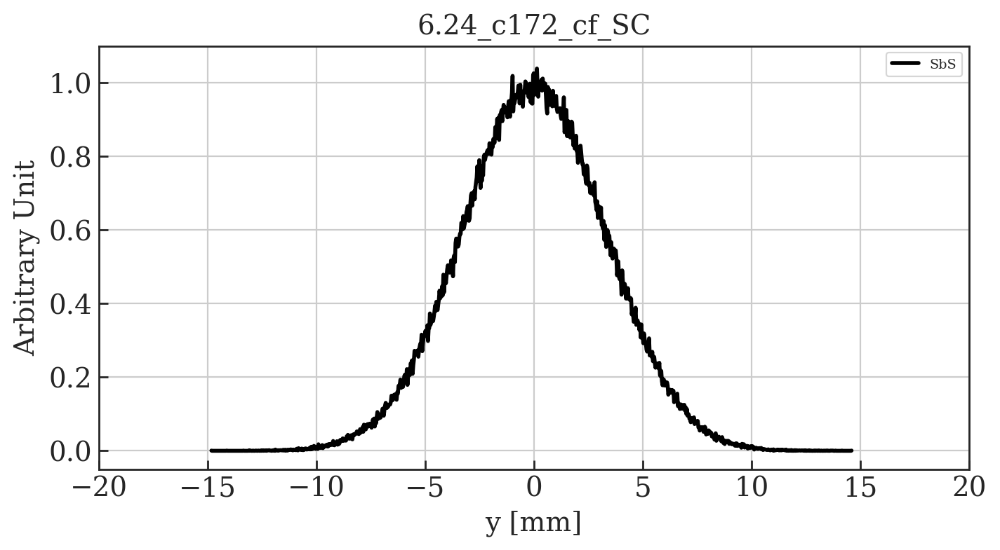

In [76]:
#Main function to plot comparison plots without MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label

        sim_labels=[label]
        
        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Compare Sims and MD data


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms], label =  SbS
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

	MAX(y_dat) =  0.07168873708334457
	index from y_dat peak not within tolerance of 1 mm. 
	try manual search
	index =  0
	index of x_dat =  -17.3658837826817  is  0
	Mean of peak point +/- 3 points =  2.44226903531713e-05
	 using peak value

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms], label =  SbS
[55, 142, 185, 226, 270, 312]

	MAX(y_dat) =  0.08387082355393713
	x_dat[index] =  -0.11689135720624932
	index of x_dat =  -0.11689135720624932  is  518
	Mean of peak point +/- 3 points =  0.07884902218381876

Importing simulation file: 614_SbS_c172
Qy =  6.14 , ctime = 172.0 [ms], label =  SbS
[10, 53, 96, 140, 183, 224, 268, 310, 354]

	MAX(y_dat) =  0.09681536486741593
	x_dat[index] =  0.4684795043273464
	index of x_dat =  0.4684795043273464  is  516
	Mean of peak point +/- 3 points =  0.09154008229271664

Importing simulation fi

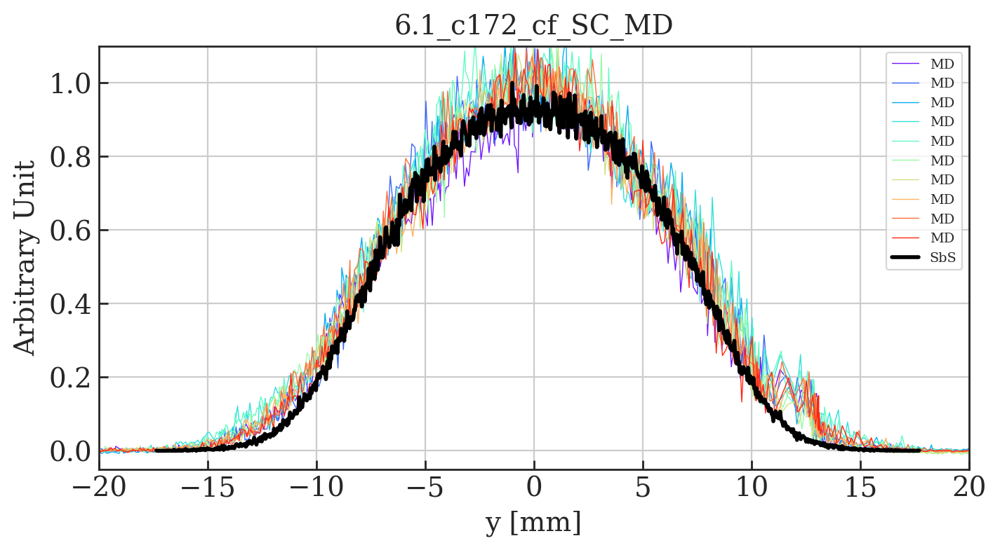

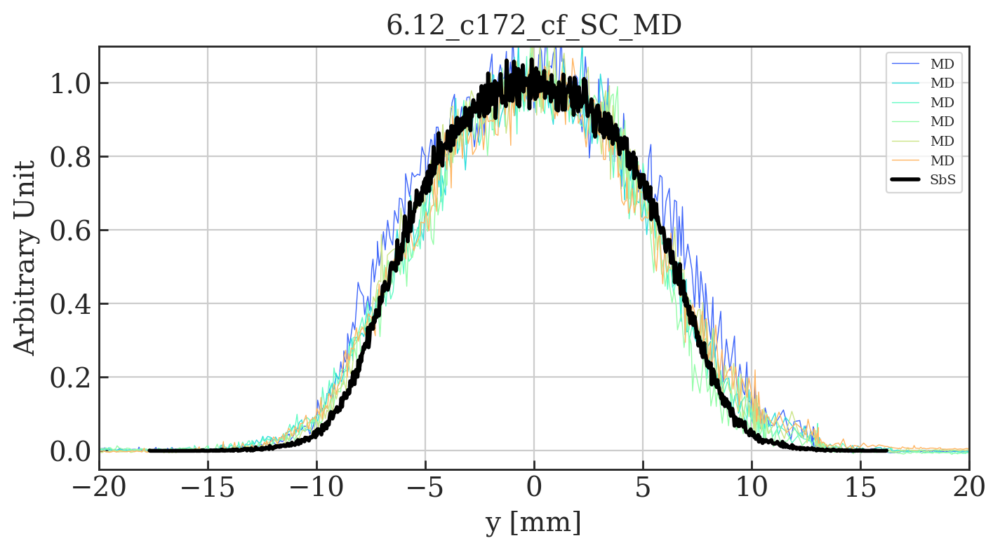

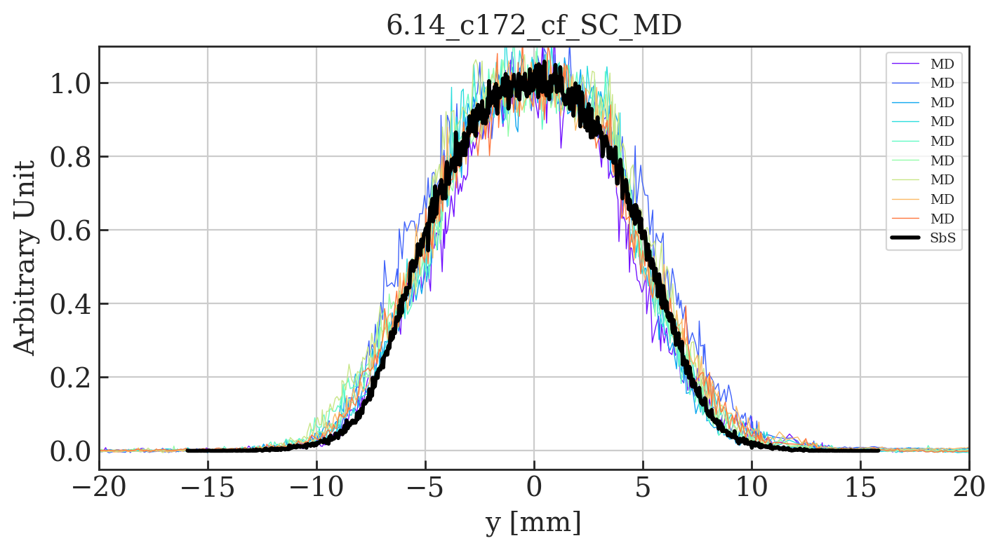

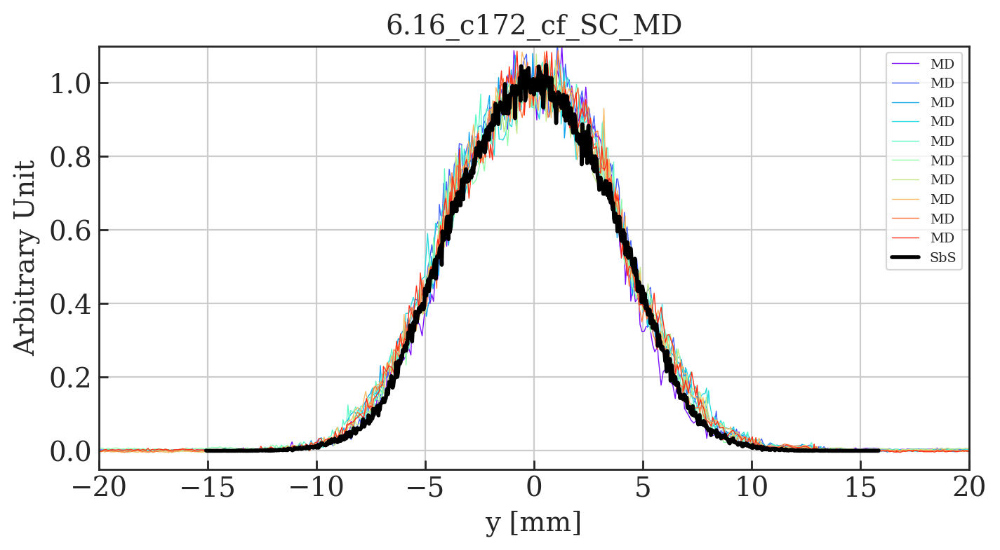

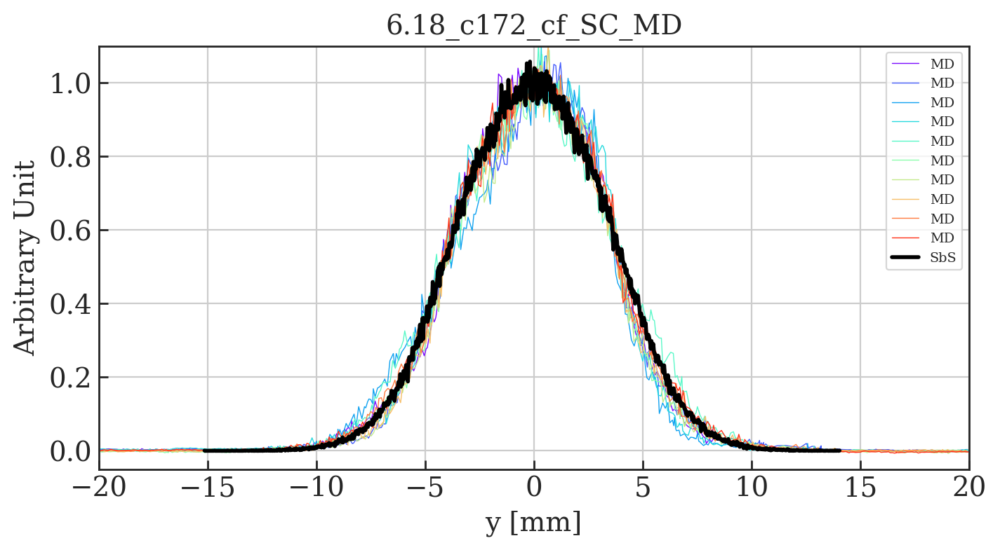

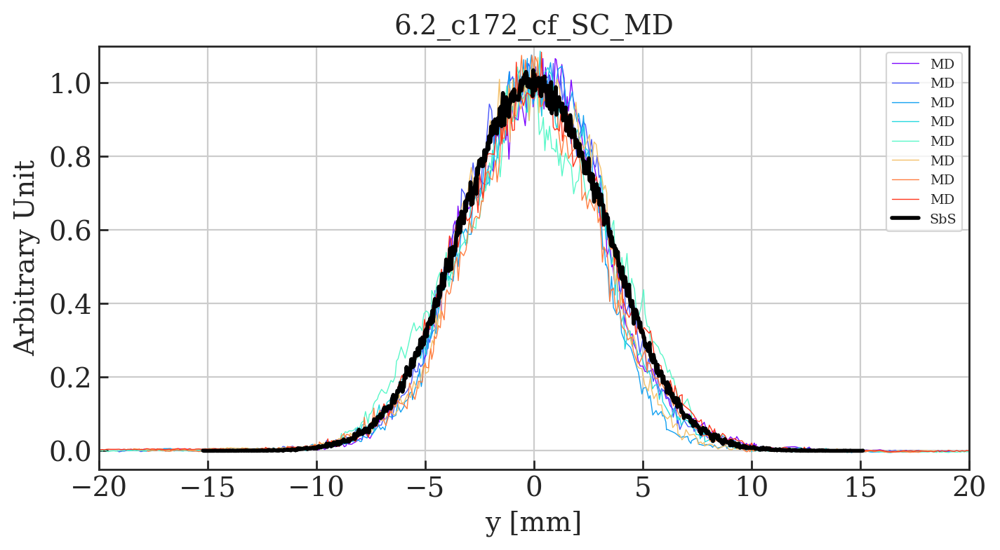

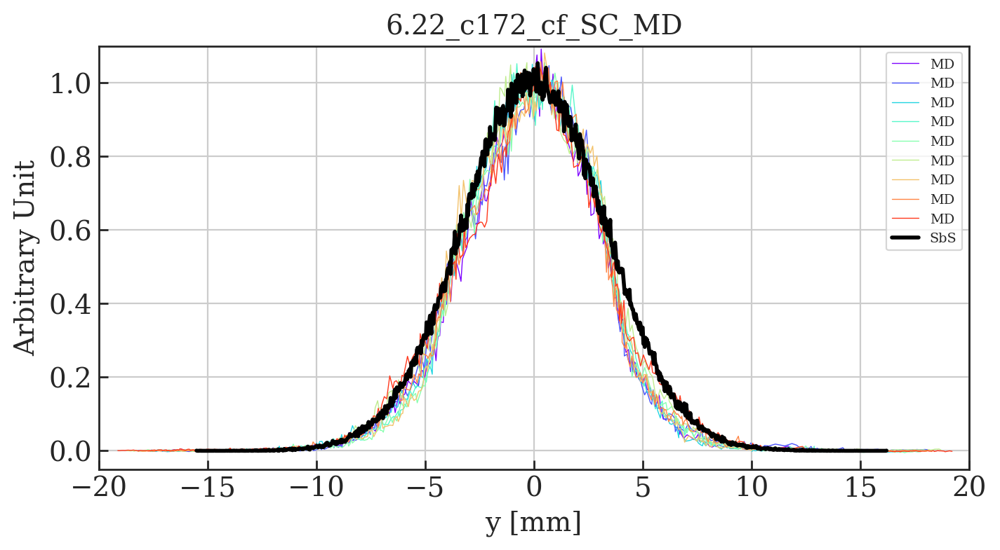

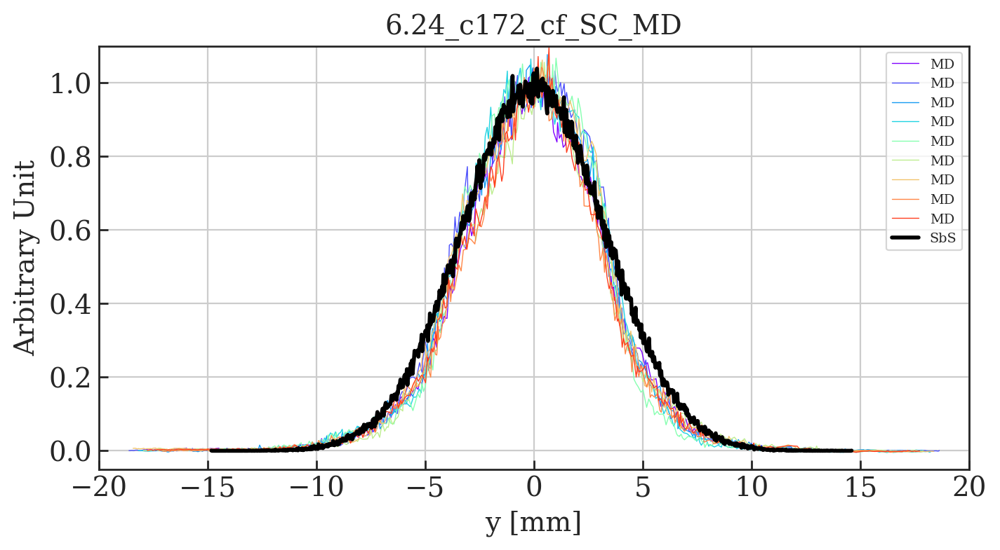

In [77]:
#Main function to plot comparison plots with MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label
        
        sim_labels=[label]

        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC_MD'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), main_label=main_label, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), main_label=main_label, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, sim_labels=sim_labels, plot_md=True)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Calculate emittances for simulated bunches

Qy =  6.1 , ctime = 172.0 [ms]
Qy =  6.12 , ctime = 172.0 [ms]
Qy =  6.14 , ctime = 172.0 [ms]
Qy =  6.16 , ctime = 172.0 [ms]
Qy =  6.18 , ctime = 172.0 [ms]
Qy =  6.2 , ctime = 172.0 [ms]
Qy =  6.22 , ctime = 172.0 [ms]
Qy =  6.24 , ctime = 172.0 [ms]


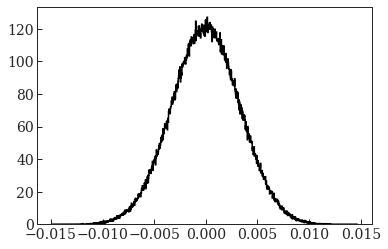

In [98]:
# Make dataframe with name, tunes, position V, profile V 
data = []

# Each row as a list
for key, value in sorted(sims.iteritems()):
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms]'

    d = particles_from_matfile(value)
    plt.clf()
    x1, bins_1, p1 = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=1.5, color='k')
          
    qx = 6.21
    qy = tune_y
    pos = np.array(bins_1[:-1]) + (abs(bins_1[0]-bins_1[1])/2)
    prof = x1
    
    new_data = [qx, qy, pos, prof]
    
    data.append(new_data)    

# Create dataframe
df_sim = pd.DataFrame(data, columns = ['Qx', 'Qy', 'PR.BWS.64.V_ROT:PROF_POSITION_IN', 'PR.BWS.64.V_ROT:PROF_DATA_IN'])

In [99]:
df_sim

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN
0,6.21,6.10,"[-0.017348335698405402, -0.0173132395298528, -...","[0.05698627749073735, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,6.21,6.12,"[-0.01766494844828203, -0.017631039159217148, ...","[0.05898088857519883, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,6.21,6.14,"[-0.015920541000558536, -0.015888748526252258,...","[0.06290796937453509, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,6.21,6.16,"[-0.015062153710938948, -0.01503121352389511, ...","[0.06464085033377805, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,6.21,6.18,"[-0.015138324484638439, -0.015109102226654826,...","[0.06844098088250315, 0.0, 0.0, 0.0, 0.0, 0.0,..."
5,6.21,6.20,"[-0.015204520063322357, -0.015174158127559435,...","[0.06587195281674171, 0.0, 0.0, 0.0, 0.0, 0.0,..."
6,6.21,6.22,"[-0.015504385952846853, -0.015472637721870141,...","[0.06299563592904027, 0.0, 0.0, 0.0, 0.0, 0.06..."
7,6.21,6.24,"[-0.01482125116966522, -0.014791794051245071, ...","[0.06789530365712468, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [114]:
def Multi_filter_sim(ndf, with_plot = False, WS = '65.H', sig_limit_mm=10, smooth = False):
    
    df = ndf.copy()
    
    position_label = 'PR.BWS.'+WS+'_ROT:PROF_POSITION_IN'
    profile_label = 'PR.BWS.'+WS+'_ROT:PROF_DATA_IN'
    
    window = 40    
    
    # Arrays to hold dataframe data. Appended to dataframe at the end of the loop.
    mu_5 = []
    sigma_5 = []
    A_5 = []
    m_5 = []
    c_5 = []
    sig_err_5 = []
    
    mu_3 = []
    sigma_3 = []
    A_3 = []
    sig_err_3 = []
    
    mom_2nd = []
    
    filtered_profiles = []
    filtered_positions = []
    
    failed_rows = []
    
    new_new_X=[]
    
    # Iterate over dataframe
    for j in range(0, len(df), 1):
        print '\nMulti_filter row ', j
        
# 5 parameter Gaussian fit to find mean and sigma
#------------------------------------------------

        data = []
        # Filter the data (scipy.signal.savgol_filter)
        if smooth: data = filtered(df[profile_label].iloc()[j])    
        else:data = df[profile_label].iloc()[j]
            
        #X = df[position_label].iloc()[j]/1000.
        X = df[position_label].iloc()[j]*1000
        Y = data
        indx_max = np.argmax(Y)
        mu0 = X[indx_max]
        x_tmp = X
        y_tmp = Y
        offs0 = min(y_tmp)
        ampl = max(y_tmp)-offs0
        x1 = x_tmp[np.searchsorted(y_tmp[:window], offs0+ampl/2)]
        x2 = x_tmp[np.searchsorted(-y_tmp[window:], -offs0+ampl/2)]
        FWHM = x2-x1
        sigma0 = np.abs(2*FWHM/2.355)
        #sigma0 = 5
        ampl *= np.sqrt(2*np.pi)*sigma0
        slope = 0
        
        ampl = peakfinder(np.array(bins_[:-1]), np.array(data))
                        
        print '\n\tinitial guess: mu0', mu0
        print '\tinitial guess: offs0', offs0
        print '\tinitial guess: ampl', ampl
        print '\tinitial guess: slope', slope
        print '\tinitial guess: sigma0', sigma0
        
        popt3 = []
        pcov3 = []   
        popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])
        result3 = gaussian_3_parameters(X, popt3[0], popt3[1], popt3[2])

        fit_A_3 = popt3[0]
        fit_mean_3 = popt3[1]
        fit_sigma_3 = popt3[2]

        A_3.append(np.array(popt3[0]))
        mu_3.append(np.array(popt3[1]))
        sigma_3.append(np.array(abs(popt3[2])))
        sig_err_3.append(np.sqrt(np.diag(pcov3[2]))[2][2])     

        print '3 parameter fit sigma = ', popt3[2] , ' +/- ', np.sqrt(np.diag(pcov3[2]))[2][2]
                
# 2nd moment
#------------------------------------------------
        # Shift centre
        new_new_X = X - fit_mean_3
        print 'Removing centre shift of ', fit_mean_3
        
        filtered_positions.append(new_new_X)
        filtered_profiles.append(Y)    

        second_mom = second_moment(new_new_X, Y)

        mom_2nd.append(second_mom)

        print 'Second moment = ', second_mom     
        
        # Plot
#------------------------------------------------      
        if with_plot:
            fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

            plt.plot(X, df[profile_label].iloc()[j], label='raw');
            plt.plot(new_new_X, result3, label='3 param fit' );
            plt.plot(new_new_X, Y, label='filtered');

            tit = 'WS profile & fit ' + str(j);
            savename = 'MD4224_HB_Vertical_Multifit_' + str(j);

            plt.title(tit);
            plt.ylabel('Profile [-]');
            plt.xlabel('Position [mm]');
            plt.legend();            
            plt.grid();
            fig.savefig(savename);
            plt.close();
             
    df['2ndMoment '+WS[-1]] = mom_2nd   
    
    df['sig '+WS[-1]] = sigma_3
    df['sig err'+WS[-1]] = sig_err_3
    df['A '+WS[-1]] = A_3
    df['mu '+WS[-1]] = mu_3
    
    df['position '+WS[-1]] = filtered_positions
    df['profile '+WS[-1]] = filtered_profiles
    
    print 'failed rows = ', failed_rows
    
    return df

In [115]:
# Gaussian and 2nd moment fits
df_sim_filtered = Multi_filter_sim(df_sim, with_plot = True, WS = '64.V', smooth=True)


Multi_filter row  0

	initial guess: mu0 0.19974857789346012
	initial guess: offs0 0.0037990851660491564
	initial guess: ampl 66.6620046822115
	initial guess: slope 0
	initial guess: sigma0 27.42121024916339
3 parameter fit sigma =  5.79966517616866  +/-  0.022188336705499603
Removing centre shift of  -0.0009113320275106683
Second moment =  5.20415904374832


/usr/local/bin/start_ipykernel.py:81: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:83: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  1

	initial guess: mu0 -0.47293889238749637
	initial guess: offs0 0.0
	initial guess: ampl 78.87823176673166
	initial guess: slope 0
	initial guess: sigma0 26.493881902072427
3 parameter fit sigma =  4.873482825679196  +/-  0.021915650210296775
Removing centre shift of  -0.0013725896941899664
Second moment =  4.345363324101448

Multi_filter row  2

	initial guess: mu0 0.26182842133654416
	initial guess: offs0 0.0
	initial guess: ampl 93.27334662986523
	initial guess: slope 0
	initial guess: sigma0 24.839979925074307
3 parameter fit sigma =  4.19412045150178  +/-  0.014903786835853482
Removing centre shift of  0.0029886228845033332
Second moment =  3.817145421440163

Multi_filter row  3

	initial guess: mu0 -0.4274452392023136
	initial guess: offs0 0.0
	initial guess: ampl 108.1823114914649
	initial guess: slope 0
	initial guess: sigma0 24.174073953574023
3 parameter fit sigma =  3.6699901399366732  +/-  0.006826615530322242
Removing centre shift of  -0.00179789890021

In [116]:
df_sim_filtered

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V
0,6.21,6.10,"[-0.017348335698405402, -0.0173132395298528, -...","[0.05698627749073735, 0.0, 0.0, 0.0, 0.0, 0.0,...",5.204159,5.79966517616866,0.022188,1030.8149227103356,-0.0009113320275106683,"[-17.347424366377894, -17.31232819782529, -17....","[0.00759817033209831, 0.00759817033209831, 0.0..."
1,6.21,6.12,"[-0.01766494844828203, -0.017631039159217148, ...","[0.05898088857519883, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.345363,4.873482825679196,0.021916,1033.037305632642,-0.0013725896941899664,"[-17.66357585858784, -17.62966656952296, -17.5...","[0.014253714739006385, 0.012779192524626413, 0..."
2,6.21,6.14,"[-0.015920541000558536, -0.015888748526252258,...","[0.06290796937453509, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.817145,4.19412045150178,0.014904,1027.2281872143371,0.0029886228845033332,"[-15.92352962344304, -15.89173714913676, -15.8...","[0.01520275926551265, 0.013630060031149272, 0...."
3,6.21,6.16,"[-0.015062153710938948, -0.01503121352389511, ...","[0.06464085033377805, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.476543,3.6699901399366732,0.006827,1015.6123060259371,-0.0017978989002126115,"[-15.060355812038736, -15.029415624994897, -14...","[0.015621538830663029, 0.014005517572318578, 0..."
4,6.21,6.18,"[-0.015138324484638439, -0.015109102226654826,...","[0.06844098088250315, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.328568,3.43696249058821,0.004134,1009.4454251845326,-0.0033868150624361873,"[-15.134937669576003, -15.10571541159239, -15....","[0.016539903713271593, 0.014828879191209014, 0..."
5,6.21,6.20,"[-0.015204520063322357, -0.015174158127559435,...","[0.06587195281674171, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.254685,3.3018631747855394,0.002275,1004.4849037354362,-0.006447643375803556,"[-15.198072419946554, -15.167710484183631, -15...","[0.015919055264045922, 0.014272256443627378, 0..."
6,6.21,6.22,"[-0.015504385952846853, -0.015472637721870141,...","[0.06299563592904027, 0.0, 0.0, 0.0, 0.0, 0.06...",3.280274,3.2824576891406347,0.001387,1000.6452499079822,0.0020001167469704713,"[-15.506386069593823, -15.474637838617111, -15...","[0.022573436207906104, 0.020548576481615524, 0..."
7,6.21,6.24,"[-0.01482125116966522, -0.014791794051245071, ...","[0.06789530365712468, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.279706,3.2938439504031556,0.001032,1000.8415782062333,-0.007655047443910615,"[-14.81359612222131, -14.784139003801162, -14....","[0.016408031717138467, 0.01471064912571035, 0...."


# Calculate Emittance for simulated bunches

In [117]:
# Calculate emittances in Vertical
df_sim_emittance = emittance_df(df_sim_filtered, WS='64.V', verbose=True)

Emittance  0  =  2.640349364772646
Emittance  1  =  1.972378954741494
Emittance  2  =  1.531387945581868
Emittance  3  =  1.2174602958066616
Emittance  4  =  1.104290719204872
Emittance  5  =  1.0467808660679045
Emittance  6  =  1.055325947386165
Emittance  7  =  1.076917460065883


In [118]:
df_sim_emittance

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,emittance V,betx,bety,dx
0,6.21,6.10,"[-0.017348335698405402, -0.0173132395298528, -...","[0.05698627749073735, 0.0, 0.0, 0.0, 0.0, 0.0,...",5.204159,5.79966517616866,0.022188,1030.8149227103356,-0.0009113320275106683,"[-17.347424366377894, -17.31232819782529, -17....","[0.00759817033209831, 0.00759817033209831, 0.0...",2.640349,11.496288,28.784027,2.723300
1,6.21,6.12,"[-0.01766494844828203, -0.017631039159217148, ...","[0.05898088857519883, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.345363,4.873482825679196,0.021916,1033.037305632642,-0.0013725896941899664,"[-17.66357585858784, -17.62966656952296, -17.5...","[0.014253714739006385, 0.012779192524626413, 0...",1.972379,11.622348,27.207938,2.699850
2,6.21,6.14,"[-0.015920541000558536, -0.015888748526252258,...","[0.06290796937453509, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.817145,4.19412045150178,0.014904,1027.2281872143371,0.0029886228845033332,"[-15.92352962344304, -15.89173714913676, -15.8...","[0.01520275926551265, 0.013630060031149272, 0....",1.531388,11.752791,25.953963,2.673757
3,6.21,6.16,"[-0.015062153710938948, -0.01503121352389511, ...","[0.06464085033377805, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.476543,3.6699901399366732,0.006827,1015.6123060259371,-0.0017978989002126115,"[-15.060355812038736, -15.029415624994897, -14...","[0.015621538830663029, 0.014005517572318578, 0...",1.217460,11.882236,24.996667,2.645956
4,6.21,6.18,"[-0.015138324484638439, -0.015109102226654826,...","[0.06844098088250315, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.328568,3.43696249058821,0.004134,1009.4454251845326,-0.0033868150624361873,"[-15.134937669576003, -15.10571541159239, -15....","[0.016539903713271593, 0.014828879191209014, 0...",1.104291,12.017877,24.169812,2.615602
5,6.21,6.20,"[-0.015204520063322357, -0.015174158127559435,...","[0.06587195281674171, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.254685,3.3018631747855394,0.002275,1004.4849037354362,-0.006447643375803556,"[-15.198072419946554, -15.167710484183631, -15...","[0.015919055264045922, 0.014272256443627378, 0...",1.046781,12.155717,23.532577,2.584384
6,6.21,6.22,"[-0.015504385952846853, -0.015472637721870141,...","[0.06299563592904027, 0.0, 0.0, 0.0, 0.0, 0.06...",3.280274,3.2824576891406347,0.001387,1000.6452499079822,0.0020001167469704713,"[-15.506386069593823, -15.474637838617111, -15...","[0.022573436207906104, 0.020548576481615524, 0...",1.055326,12.286640,23.068469,2.552595
7,6.21,6.24,"[-0.01482125116966522, -0.014791794051245071, ...","[0.06789530365712468, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.279706,3.2938439504031556,0.001032,1000.8415782062333,-0.007655047443910615,"[-14.81359612222131, -14.784139003801162, -14....","[0.016408031717138467, 0.01471064912571035, 0....",1.076917,12.418697,22.763065,2.520970


In [119]:
df_sim_emittance_2 = emittance_df_2(df_sim_emittance, WS='65.H', verbose=True)

Emittance  0  =  2.640349364772646
Emittance  1  =  1.972378954741494
Emittance  2  =  1.531387945581868
Emittance  3  =  1.2174602958066616
Emittance  4  =  1.104290719204872
Emittance  5  =  1.0467808660679045
Emittance  6  =  1.055325947386165
Emittance  7  =  1.076917460065883


# Calculate Emittance using 2nd moment for simulated bunches

In [120]:
df_sim_emittance_2

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,emittance V,betx,bety,dx,emittance V 2ndMoment
0,6.21,6.10,"[-0.017348335698405402, -0.0173132395298528, -...","[0.05698627749073735, 0.0, 0.0, 0.0, 0.0, 0.0,...",5.204159,5.79966517616866,0.022188,1030.8149227103356,-0.0009113320275106683,"[-17.347424366377894, -17.31232819782529, -17....","[0.00759817033209831, 0.00759817033209831, 0.0...",2.640349,11.496288,28.784027,2.723300,2.125968
1,6.21,6.12,"[-0.01766494844828203, -0.017631039159217148, ...","[0.05898088857519883, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.345363,4.873482825679196,0.021916,1033.037305632642,-0.0013725896941899664,"[-17.66357585858784, -17.62966656952296, -17.5...","[0.014253714739006385, 0.012779192524626413, 0...",1.972379,11.622348,27.207938,2.699850,1.568064
2,6.21,6.14,"[-0.015920541000558536, -0.015888748526252258,...","[0.06290796937453509, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.817145,4.19412045150178,0.014904,1027.2281872143371,0.0029886228845033332,"[-15.92352962344304, -15.89173714913676, -15.8...","[0.01520275926551265, 0.013630060031149272, 0....",1.531388,11.752791,25.953963,2.673757,1.268472
3,6.21,6.16,"[-0.015062153710938948, -0.01503121352389511, ...","[0.06464085033377805, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.476543,3.6699901399366732,0.006827,1015.6123060259371,-0.0017978989002126115,"[-15.060355812038736, -15.029415624994897, -14...","[0.015621538830663029, 0.014005517572318578, 0...",1.217460,11.882236,24.996667,2.645956,1.092497
4,6.21,6.18,"[-0.015138324484638439, -0.015109102226654826,...","[0.06844098088250315, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.328568,3.43696249058821,0.004134,1009.4454251845326,-0.0033868150624361873,"[-15.134937669576003, -15.10571541159239, -15....","[0.016539903713271593, 0.014828879191209014, 0...",1.104291,12.017877,24.169812,2.615602,1.035735
5,6.21,6.20,"[-0.015204520063322357, -0.015174158127559435,...","[0.06587195281674171, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.254685,3.3018631747855394,0.002275,1004.4849037354362,-0.006447643375803556,"[-15.198072419946554, -15.167710484183631, -15...","[0.015919055264045922, 0.014272256443627378, 0...",1.046781,12.155717,23.532577,2.584384,1.017081
6,6.21,6.22,"[-0.015504385952846853, -0.015472637721870141,...","[0.06299563592904027, 0.0, 0.0, 0.0, 0.0, 0.06...",3.280274,3.2824576891406347,0.001387,1000.6452499079822,0.0020001167469704713,"[-15.506386069593823, -15.474637838617111, -15...","[0.022573436207906104, 0.020548576481615524, 0...",1.055326,12.286640,23.068469,2.552595,1.053922
7,6.21,6.24,"[-0.01482125116966522, -0.014791794051245071, ...","[0.06789530365712468, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.279706,3.2938439504031556,0.001032,1000.8415782062333,-0.007655047443910615,"[-14.81359612222131, -14.784139003801162, -14....","[0.016408031717138467, 0.01471064912571035, 0....",1.076917,12.418697,22.763065,2.520970,1.067693


# Save simulation dataframe to pickle file

In [121]:
df_sim_emittance_2.to_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete_simulation_data')

In [122]:
df0_sim = pnd.read_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete_simulation_data')

# Plots

1.076917460065883

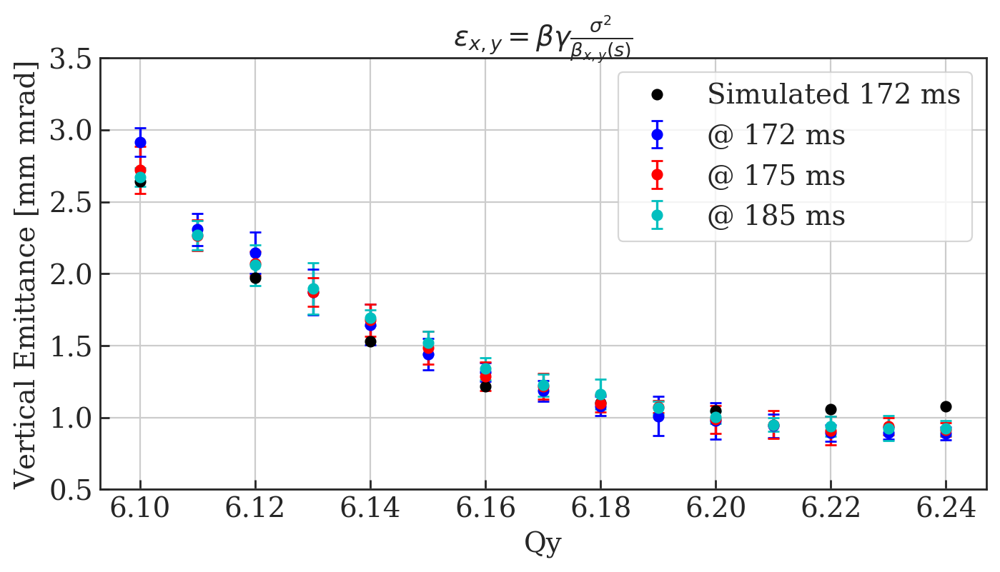

In [134]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.plot(df0_sim['Qy'], df0_sim['emittance V'], label='Simulated 172 ms', linestyle='None', marker='o', color='k')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 3.5)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics_Sim.png');